# Generate full emissions portfolio from projected Kyoto gas baskets
Updated to include announcements as of 20/09/23. Including an analysis of full impact of Net Zero commitments on emissions.
# Part 3: extend and infill data

In [1]:
import country_converter
import matplotlib.pyplot as plt
import os
import numpy as np
import pandas as pd
import pyam
import pymagicc
import re
import scmdata
from scipy.interpolate import interp1d, PchipInterpolator

<IPython.core.display.Javascript object>

In [2]:
import sys
stdout = sys.stdout

In [3]:
from silicone.time_projectors import ExtendLatestTimeQuantile
import silicone.multiple_infillers as mi
import silicone.database_crunchers as dc
from silicone.utils import convert_units_to_MtCO2_equiv, _construct_consistent_values

In [4]:
version_no = "r10_3"

# Import the data

In [5]:
co2 = "Emissions|CO2"
co2ind = "Emissions|CO2|Energy and Industrial Processes"
co2afolu = "Emissions|CO2|AFOLU"
variable = "Emissions|Kyoto Gases (AR6-GWP100)"
kyexaf = variable + "|Excluding CO2 AFOLU"
unit = "Mt CO2-equiv/yr"
co2unit = "Mt CO2/yr"
regional_emtype = [co2ind, co2afolu, "Emissions|CH4", "Emissions|N2O", "Emissions|F-Gases"]
years = [2015, 2019] + list(range(2010, 2101, 10))

In [6]:
out_folder = f"../output/processed_files/{version_no}/"
harm_all = pyam.IamDataFrame(out_folder + f"harm_all_{version_no}.csv")
harmed_sr15  = pyam.IamDataFrame(out_folder + "ar6_cleaned_harmed.csv")
harmed_sr15_regions = pyam.IamDataFrame(out_folder + "ar6_cleaned_harmed_regions.csv")
sr15 = pyam.IamDataFrame(out_folder + "ar6_cleaned.csv")

pyam - INFO: Running in a notebook, setting up a basic logging at level INFO
pyam.core - INFO: Reading file ..\output\processed_files\r10_3\harm_all_r10_3.csv
pyam.core - INFO: Reading file ..\output\processed_files\r10_3\ar6_cleaned_harmed.csv
pyam.core - INFO: Reading file ..\output\processed_files\r10_3\ar6_cleaned_harmed_regions.csv
pyam.core - INFO: Reading file ..\output\processed_files\r10_3\ar6_cleaned.csv


# Calculate implied carbon price
Firstly we calculate the carbon price of the pathway up to 2030. Then we extend the carbon price from 2030 in various ways. We then interpolate the Kyoto emissions from this. 

In [7]:
# One scenario is treated as default for calculating the CO2 fraction of GHG emissions. 
defaultmodel = "MESSAGEix-GLOBIOM_1.1"
defaultscen = "EN_NoPolicy"

# Most calculations consider other scenarios too! 

mod_scen_list = [
    ("MESSAGEix-GLOBIOM_1.1", ["EN_NPi2020_*00f", "EN_NoPolicy"], "EN_NPi"), 
    ("REMIND-MAgPIE 2.1-4.2", ["EN_NPi2020_*00f", "EN_NoPolicy"], "EN_NPi"),
]
hfcs = [
    "Emissions|HFC|HFC125", "Emissions|HFC|HFC134a", "Emissions|HFC|HFC143a",
    "Emissions|HFC|HFC227ea", "Emissions|HFC|HFC23", "Emissions|HFC|HFC32", "Emissions|HFC|HFC43-10",
]
fgases = ["Emissions|HFC", "Emissions|SF6", 'Emissions|PFC|C2F6', 'Emissions|PFC|CF4']
fgas = "Emissions|F-Gases"

In [8]:
price = "Price|Carbon"
price_unit = "US$2010/t CO2"
orig_ssps = sr15.filter(model=[m[0] for m in mod_scen_list])
harmed_sr15_regions = harmed_sr15_regions.append(orig_ssps.filter(variable=price))
harmed_sr15 = harmed_sr15.interpolate(years).append(orig_ssps.filter(variable=price, region="World"))

In [9]:
harmed_sr15_regions.filter(variable=variable).region

['R10AFRICA',
 'R10CHINA+',
 'R10EUROPE',
 'R10INDIA+',
 'R10LATIN_AM',
 'R10MIDDLE_EAST',
 'R10NORTH_AM',
 'R10PAC_OECD',
 'R10REF_ECON',
 'R10REST_ASIA',
 'R10ROWO',
 'World']

In [10]:
simplest_infill_data = harm_all.filter(region="World", year=[2010, 2015, 2019, 2020, 2030])
simplest_infill_data.timeseries().head()

2015  \
model                  scenario          region variable                           unit                            
Current policies       Max|Harmonized    World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  53692.293621   
                       Median|Harmonized World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  53692.293621   
                       Min|Harmonized    World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  53692.293621   
NDC case - conditional Max|Harmonized    World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  53692.293621   
                       Median|Harmonized World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  53692.293621   

                                                                                                          2019  \
model                  scenario          region variable                           unit                          
Current policies       Max|Harmonized    World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  55655.8363   
                       Median|Harmonized World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  55655.8363   
                       Min|Harmonized    World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  55655.8363   
NDC case - conditional Max|Harmonized    World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  55655.8363   
                       Median|Harmonized World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  55655.8363   

                                                                                                            2020  \
model                  scenario          region variable                           unit                            
Current policies       Max|Harmonized    World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  55926.631256   
                       Median|Harmonized World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  55926.631256   
                       Min|Harmonized    World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  55926.631256   
NDC case - conditional Max|Harmonized    World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  55926.631256   
                       Median|Harmonized World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  55926.631256   

                                                                                                            2030  
model                  scenario          region variable                           unit                           
Current policies       Max|Harmonized    World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  59693.646439  
                       Median|Harmonized World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  56279.140032  
                       Min|Harmonized    World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  51552.681698  
NDC case - conditional Max|Harmonized    World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  55077.991661  
                       Median|Harmonized World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  51482.429705

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


MESSAGEix-GLOBIOM_1.1_EN_NPi  \
model                    scenario                                          
Current policies         Max|Harmonized                         2.905026   
                         Median|Harmonized                      8.622133   
                         Min|Harmonized                        16.612115   
NDC case - conditional   Max|Harmonized                        10.409242   
                         Median|Harmonized                     16.750004   
                         Min|Harmonized                        20.460180   
NDC case - unconditional Max|Harmonized                         7.775948   
                         Median|Harmonized                     10.642168   
                         Min|Harmonized                        12.855637   

                                            REMIND-MAgPIE 2.1-4.2_EN_NPi  
model                    scenario                                         
Current policies         Max|Harmonized                         1.979482  
                         Median|Harmonized                      5.517416  
                         Min|Harmonized                        16.093412  
NDC case - conditional   Max|Harmonized                         7.627680  
                         Median|Harmonized                     16.215850  
                         Min|Harmonized                        23.118646  
NDC case - unconditional Max|Harmonized                         4.830283  
                         Median|Harmonized                      7.958255  
                         Min|Harmonized                        11.751039

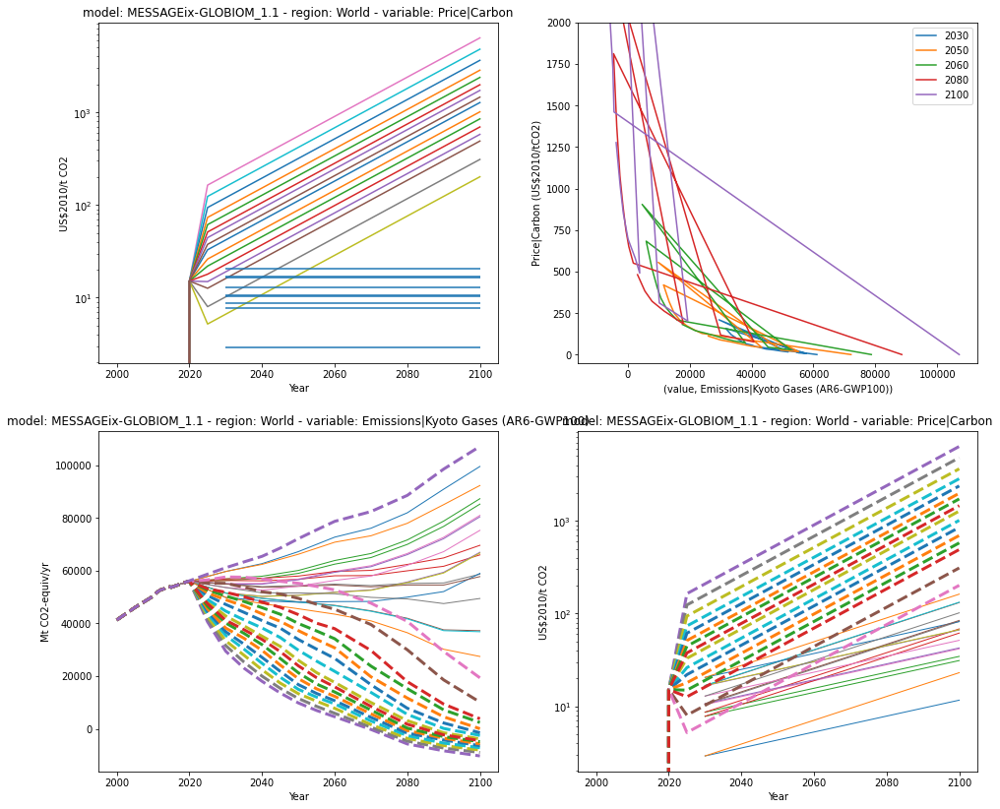

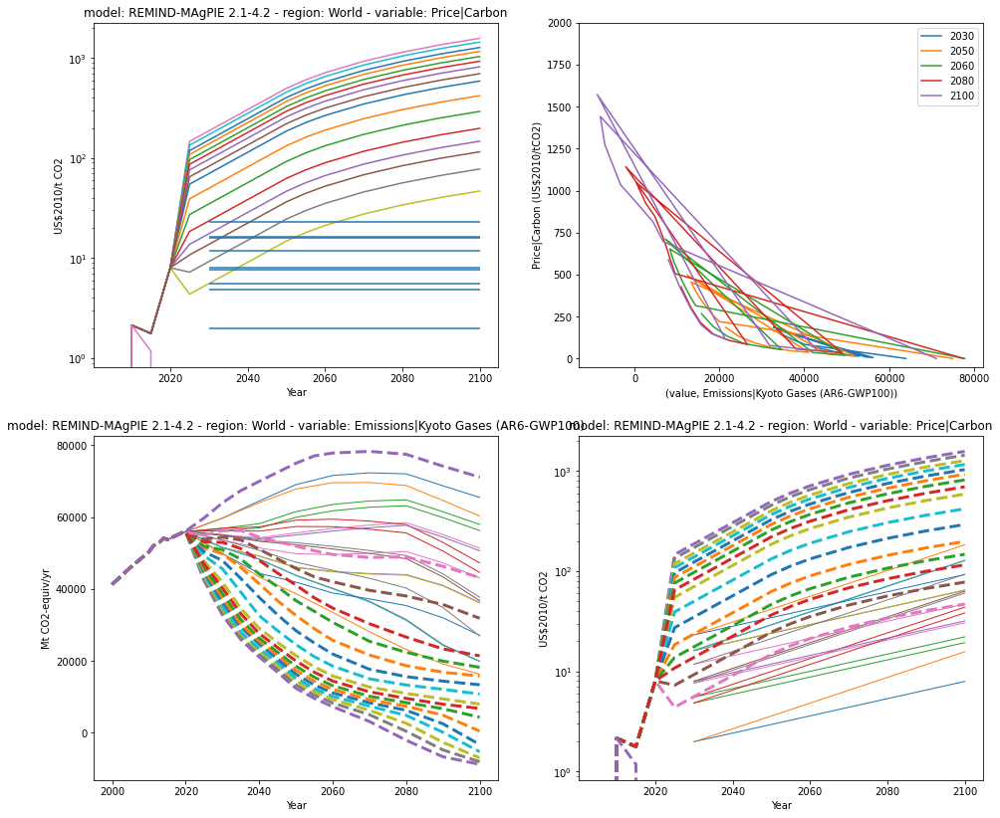

In [11]:
# Calculate initial carbon price trajectory. Then assume the carbon price increases by some 
# amount each year
increase_rates = [2, 3]
price_kyoto_var = variable
kindinterp = "PchipInterpolator"
if price_kyoto_var == kyexaf:
    price_scenario_str = "|KyotoExAfFromPrice_incrate"
else:
    price_scenario_str = "|KyotoFromPrice_incrate"
if kindinterp == "PchipInterpolator":
    def interpfunction(**args):
        order = np.argsort(args["x"])
        def pchipWithLimits(interpx):
            interpx2 = interpx.copy()
            interpx2[interpx > max(args["x"])] = max(args["x"])
            interpx2[interpx < min(args["x"])] = min(args["x"])
            return PchipInterpolator(args["x"][order], args["y"][order], extrapolate=False)(interpx2)
        return pchipWithLimits
else:
    def interpfunction(**args):
        return interp1d(**args)
unep2030 = simplest_infill_data.filter(year=2030, variable=price_kyoto_var).data.pivot(
    index=["model", "scenario"], columns="variable"
)
# set up plots
all_carbon_prices = pd.DataFrame(index=unep2030.index, dtype="float64")
# Ensure that the final placement is clear (this allows the cell to be rerunable)
try:
    del all_kyoto_prices 
except NameError:
    pass
for (model, scenario, shortname) in mod_scen_list:
    plt.figure(figsize=(16, 14))
    i = 1
    # Calculate the implied price in 2030
    label = model + "_" + shortname
    price2030 = harmed_sr15.filter(
        variable=[price, price_kyoto_var], model=model, scenario=scenario, year=2030).data[[
        "scenario", "variable", "value"
    ]].pivot(
        index=["scenario"], columns="variable"
    ).fillna(0)
    implied_price = interpfunction(
        x=price2030[("value", price_kyoto_var)],  y=price2030[("value", price)], 
        bounds_error=False,
        fill_value=(max(price2030[("value", price)]), min(price2030[("value", price)])),
        kind=kindinterp
    )(unep2030["value"])
    all_carbon_prices[label] = implied_price
    price_infiller = dc.Interpolation(
        harmed_sr15.filter(variable=[price, price_kyoto_var], model=model, scenario=scenario)
    ).derive_relationship(price, [price_kyoto_var], interpkind=kindinterp)
    for increase_rate in increase_rates:
        # Get a copy of the trend so far
        price_kyoto_to_date = simplest_infill_data.filter(variable=price_kyoto_var).data.copy()
        price_kyoto_to_date["scenario"] =  price_kyoto_to_date["scenario"] + \
        price_scenario_str + str(increase_rate) + "_" + model + "_" + shortname
        try:
            all_kyoto_prices = all_kyoto_prices.append(price_kyoto_to_date)
        except NameError:
            all_kyoto_prices = price_kyoto_to_date
        
        # insert prices for the years so far (after 2030 because values are silly before that)
        price_to_date = pyam.IamDataFrame(price_kyoto_to_date).filter(year=[2030]).data
        price_to_date["variable"] = price
        year = 2030
        priceyear = harmed_sr15.filter(
            variable=[price, price_kyoto_var], model=model, scenario=scenario, year=year
        ).data[["scenario", "variable", "value"]].pivot(index=["scenario"], columns="variable").fillna(0)
        locs = price_to_date.year == year
        price_to_date.loc[locs, "value"] = interpfunction(
            x=priceyear[("value", price_kyoto_var)], y=priceyear[("value", price)], 
            fill_value=(max(priceyear[("value", price)]), min(priceyear[("value", price)])),
            bounds_error=False, kind=kindinterp
        )(price_to_date.loc[locs, "value"])
        price_to_date.loc[locs, "unit"] = price_unit
        
        all_kyoto_prices = all_kyoto_prices.append(price_to_date)

        for year in list(range(2040, 2101, 10)):
            price_kyoto = simplest_infill_data.filter(year=2030, variable=price_kyoto_var).data.copy()
            price_kyoto["year"] = year
            price_kyoto["scenario"] =  price_kyoto["scenario"] + price_scenario_str + str(increase_rate) \
                + "_" + model + "_" + shortname
            price_df = price_kyoto.copy()
            price_df["variable"] = price
            price_df["unit"] = price_unit
            priceyear = harmed_sr15.filter(
                variable=[price, price_kyoto_var], model=model, scenario=scenario, year=year
            ).data[["scenario", "variable", "value"]].pivot(
                index=["scenario"], columns="variable"
            ).fillna(0)
            price_df["value"] = (all_carbon_prices[label] * (1+increase_rate/100) ** (year-2030)).tolist()
            price_kyoto["value"] = interpfunction(
                x=priceyear[("value", price)],
                y=priceyear[("value", price_kyoto_var)], kind=kindinterp,
                fill_value = (max(priceyear[("value", price_kyoto_var)]), 
                              min(priceyear[("value", price_kyoto_var)]))
            )(price_df["value"])
            all_kyoto_prices = all_kyoto_prices.append(price_kyoto).append(price_df)
    ax=plt.subplot(2, 2, i)
    harmed_sr15.filter(variable=price, model=model, scenario=scenario).plot(ax=ax)
    plt.hlines(implied_price, xmin=2030, xmax=2100)
    plt.yscale("log")
    ax = plt.subplot(2, 2, i+1)
    harmed_sr15.filter(variable=[price, price_kyoto_var], model=model, scenario=scenario, year=2030).data.pivot(
        columns="variable", index=["model", "scenario"]
    ).plot.line(x=("value", price_kyoto_var), y=("value", price), ax=ax, label="2030")
    harmed_sr15.filter(variable=[price, price_kyoto_var], model=model, scenario=scenario, year=2050).data.pivot(
        columns="variable", index=["model", "scenario"]
    ).plot.line(x=("value", price_kyoto_var), y=("value", price), ax=ax, label="2050")
    harmed_sr15.filter(variable=[price, price_kyoto_var], model=model, scenario=scenario, year=2060).data.pivot(
        columns="variable", index=["model", "scenario"]
    ).plot.line(x=("value", price_kyoto_var), y=("value", price), ax=ax, label="2060")
    harmed_sr15.filter(variable=[price, price_kyoto_var], model=model, scenario=scenario, year=2080).data.pivot(
        columns="variable", index=["model", "scenario"]
    ).plot.line(x=("value", price_kyoto_var), y=("value", price), ax=ax, label="2080")
    harmed_sr15.filter(variable=[price, price_kyoto_var], model=model, scenario=scenario, year=2100).data.pivot(
        columns="variable", index=["model", "scenario"]
    ).plot.line(x=("value", price_kyoto_var), y=("value", price), ax=ax, label="2100")
    ax.set_ylim([-50, 2000])
    ax.set_ylabel(price + " (US\$2010/tCO2)")
    ax = plt.subplot(2, 2, i+2)
    pyam.IamDataFrame(all_kyoto_prices).filter(scenario = "*" + label + "*", variable=price_kyoto_var).plot(
        ax=ax, linewidth=1)
    harmed_sr15.filter(variable=price_kyoto_var, model=model, scenario=scenario).plot(
        ax=ax, linewidth=3, linestyle="--")
    ax = plt.subplot(2, 2, i+3)
    pyam.IamDataFrame(all_kyoto_prices).filter(scenario = "*" + label + "*", variable=price).plot(
        ax=ax, linewidth=1)
    harmed_sr15.filter(variable=price, model=model, scenario=scenario).plot(
        ax=ax, linewidth=3, linestyle="--")
    plt.yscale("log")
    i += 3
all_carbon_prices

In [12]:
# infilling from price is bad if we don't meet this condition. 
if not ((max(price2030[("value", price_kyoto_var)]) >= max(unep2030[("value", price_kyoto_var)]) ) or 
    (min(price2030[("value", price_kyoto_var)]) <= min(unep2030[("value", price_kyoto_var)]))
):
    print("WARNING: emissions not always in expected range")
    stop

In [179]:
pyam.IamDataFrame(all_kyoto_prices).filter(variable=price, model=case[0], scenario="Median|Harmonized|KyotoFromPrice_incrate3*")

<class 'pyam.core.IamDataFrame'>
Index:
 * model    : Current policies (1)
 * scenario : ... (2)
Timeseries data coordinates:
   region   : World (1)
   variable : Price|Carbon (1)
   unit     : US$2010/t CO2 (1)
   year     : 2030, 2040, 2050, 2060, 2070, 2080, 2090, 2100 (8)
Meta indicators:
   exclude (bool) False (1)

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


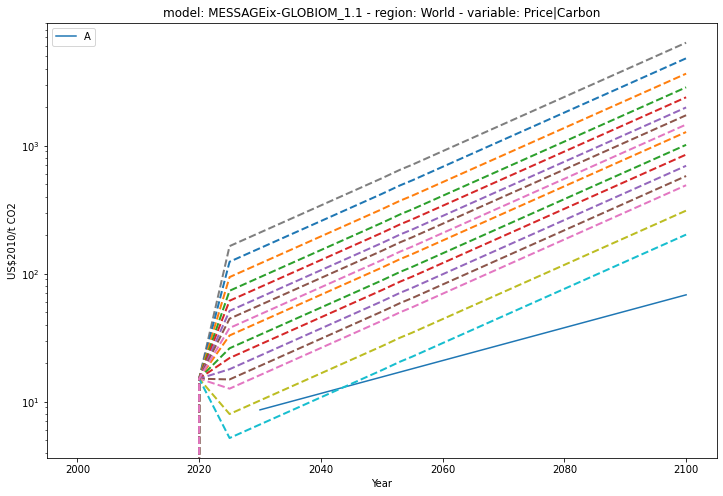

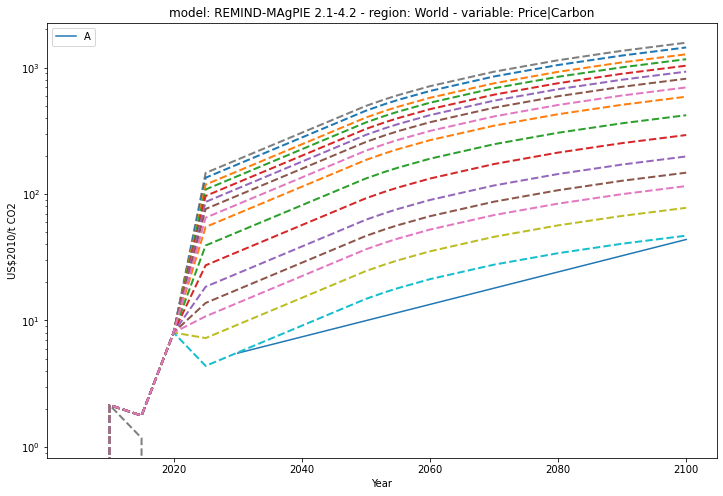

In [184]:
for (model, scenario, shortname) in mod_scen_list:
    plt.figure(figsize=(12, 8))
    ax = plt.subplot()
    for case in [
        ('Current policies', f'Median|Harmonized|KyotoFromPrice_incrate3_{model}_{shortname}'),
    ]:
        pyam.IamDataFrame(pyam.IamDataFrame(all_kyoto_prices).filter(variable=price, model=case[0], scenario=case[1]).timeseries()).plot(ax=ax)
        harmed_sr15.filter(variable=price, model=model, scenario=scenario).plot(ax=ax, linestyle="--", linewidth=2)
        plt.yscale("log")
        plt.legend(["A"])

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'region: World - variable: Emissions|Kyoto Gases (AR6-GWP100)'}, xlabel='Year', ylabel='Mt CO2-equiv/yr'>

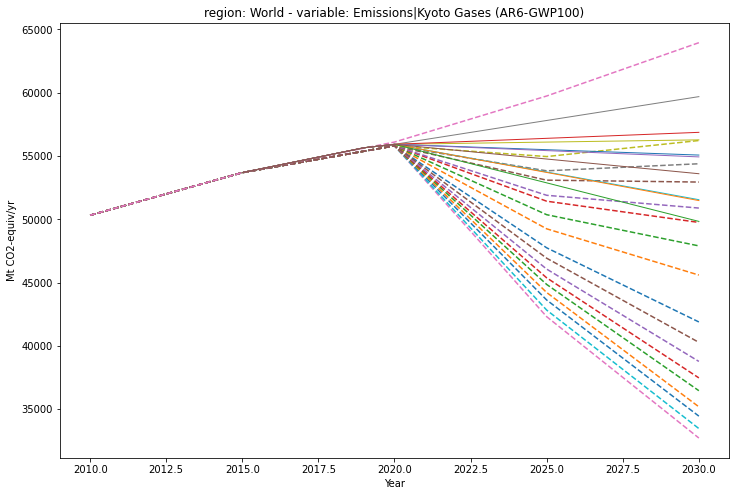

In [14]:
plt.figure(figsize=(12,8))
ax=plt.subplot()
harmed_sr15.filter(model=model, region="World", scenario=scenario, variable=price_kyoto_var, year=[2010, 2015, 2020, 2025, 2030]).plot(
    ax=ax, linestyle="--")
simplest_infill_data.filter(variable=price_kyoto_var).plot(ax=ax, linewidth=1)

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


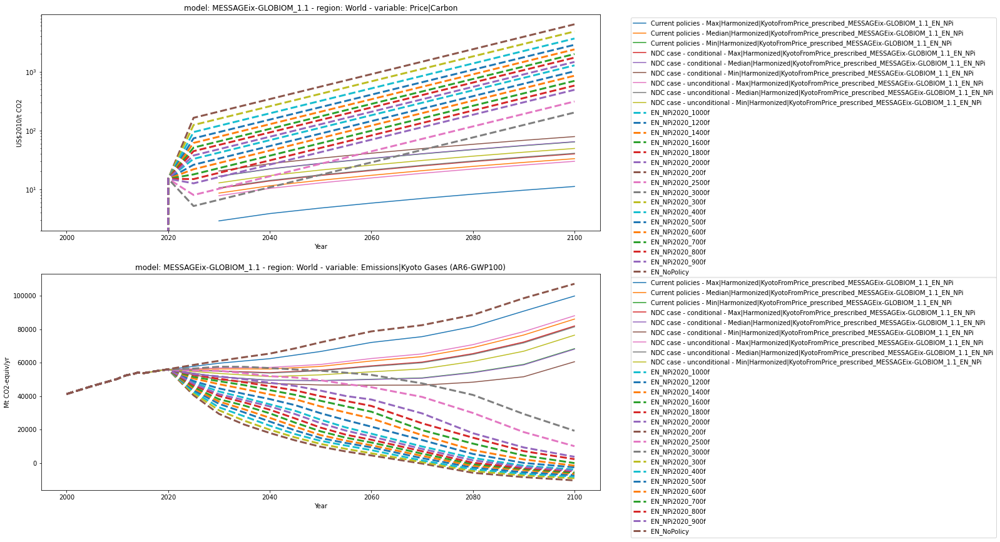

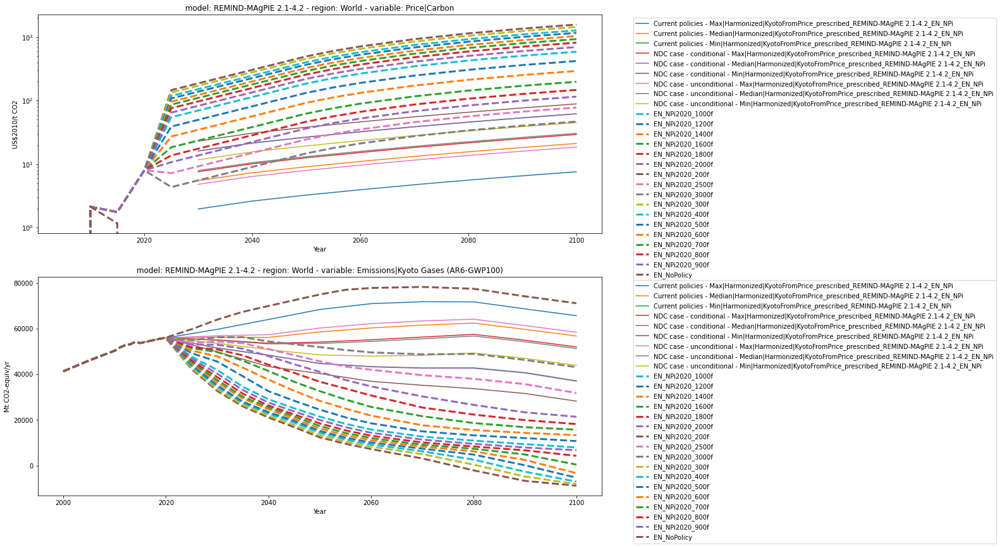

In [15]:
# We also investigate the effect of adding in a prescribed rate of 
# growth which mimics the growth of GDP in MESSAGE-GLOBIOM SSP2
prescribed_price_path = pd.read_excel(
    "../input/Carbon_price_prescribed_CAGR.xlsx", header=2, index_col=0
)
prescribed_price_path = prescribed_price_path.transpose()
prescribed_kyoto_prices = []

for (model, scenario, shortname) in mod_scen_list:
    label = model + "_" + shortname
    price_kyoto_to_date = simplest_infill_data.filter(variable=price_kyoto_var).data.copy()
    if price_kyoto_var == kyexaf:
        presc_str = "|KyotoExAfFromPrice_prescribed" + "_" + model + "_" + shortname
    else:
        presc_str = "|KyotoFromPrice_prescribed" + "_" + model + "_" + shortname
    price_kyoto_to_date["scenario"] =  price_kyoto_to_date["scenario"] + presc_str
    # We still need the historic data
    price_to_date = price_kyoto_to_date.copy()
    price_to_date["variable"] = price
    for year in price_to_date.year.unique():
        if year >= 2030:
            priceyear = harmed_sr15.filter(variable=[price, price_kyoto_var], model=model, scenario=scenario, year=year).data[[
                "scenario", "variable", "value"
            ]].pivot(
                index=["scenario"], columns="variable"
            ).fillna(0)
            locs = price_to_date.year == year
            price_to_date.loc[locs, "value"] = interpfunction(
                x=priceyear[("value", price_kyoto_var)], y=priceyear[("value", price)], 
                fill_value = (max(priceyear[("value", price)]), min(priceyear[("value", price)])), 
                bounds_error=False, kind=kindinterp
            )(price_to_date.loc[locs, "value"])
            price_to_date.loc[locs, "unit"] = price_unit
        else:
            price_to_date = price_to_date[price_to_date.year != year]
    prescribed_kyoto_prices.append(pyam.IamDataFrame(price_to_date))
    prescribed_kyoto_prices.append(pyam.IamDataFrame(price_kyoto_to_date))

    # Then add the future info
    for year in list(range(2040, 2101, 10)):
        price_kyoto = simplest_infill_data.filter(year=2030, variable=price_kyoto_var).data.copy()
        price_kyoto["year"] = year
        price_kyoto["scenario"] =  price_kyoto["scenario"] + presc_str
        priceyear = harmed_sr15.filter(variable=[price, price_kyoto_var], model=model, scenario=scenario, year=year).data[[
            "scenario", "variable", "value"
        ]].pivot(
            index=["scenario"], columns="variable"
        ).fillna(0)
        price_df = price_kyoto.copy()
        price_df["variable"] = price
        price_df["unit"] = price_unit
        inflation = (1+prescribed_price_path[prescribed_price_path.index <= year]).product()[0]
        price_df["value"] = (all_carbon_prices[label] * inflation).tolist()
        price_kyoto["value"] = interpfunction(
            x=priceyear[("value", price)],
            y=priceyear[("value", price_kyoto_var)],
            fill_value = (max(priceyear[("value", price_kyoto_var)]), min(priceyear[("value", price_kyoto_var)])),
            kind=kindinterp
        )(price_df["value"])
        prescribed_kyoto_prices.append(pyam.IamDataFrame(price_kyoto))
        prescribed_kyoto_prices.append(pyam.IamDataFrame(price_df))
    plt.figure(figsize=(16,14))
    ax = plt.subplot(2, 1, 1)
    pyam.concat(prescribed_kyoto_prices).filter(scenario="*" + presc_str, variable=price).plot(ax=ax)
    harmed_sr15.filter(model=model, region="World", scenario=scenario, variable=price).plot(ax=ax, linestyle="--", linewidth=3)
    plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.yscale("log")
    ax = plt.subplot(2, 1, 2)
    pyam.concat(prescribed_kyoto_prices).filter(scenario="*" + presc_str, variable=price_kyoto_var).plot(ax=ax)
    harmed_sr15.filter(model=model, region="World", scenario=scenario, variable=price_kyoto_var).plot(
        ax=ax, linestyle="--", linewidth=3
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")

In [16]:
all_kyoto_prices = pyam.IamDataFrame(all_kyoto_prices).filter(scenario="*prescribed*", keep=False).append(
    pyam.concat(prescribed_kyoto_prices)
)

In [17]:
all_kyoto_prices = pyam.IamDataFrame(all_kyoto_prices.data.copy())

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'region: World - variable: Emissions|Kyoto Gases (AR6-GWP100)'}, xlabel='Year', ylabel='Mt CO2-equiv/yr'>

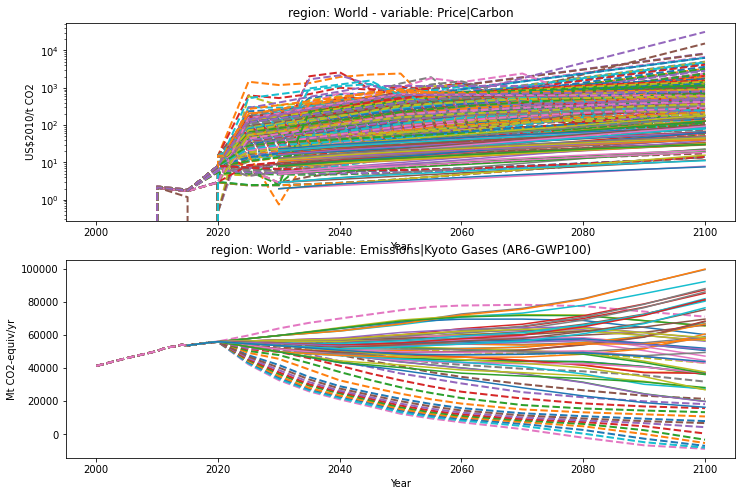

In [18]:
# Sanity check all the prices
# Sanity check the prices/Kyoto totals
plt.figure(figsize=(12, 8))
ax=plt.subplot(2,1,1)
harmed_sr15.filter(variable=[price]).plot(ax=ax, linewidth=2, linestyle="--")
all_kyoto_prices.filter(variable=price).plot(ax=ax)
plt.yscale("log")
ax=plt.subplot(2,1,2)
harmed_sr15.filter(variable=price_kyoto_var, model=model, scenario=scenario).plot(ax=ax, linewidth=2, linestyle="--")
all_kyoto_prices.filter(variable=price_kyoto_var).plot(ax=ax)

# Project Kyoto totals to 2100 directly and infill all values from this

In [19]:
# Define the function to perform the split and infill
def infill_components_of_partial_aggregate(
    price_kyoto_var, extend_df, infill_df, non_co2_ind_compon, co2, co2ind, co2afolu, 
    fgas_em_inf, years, fgas, fgases, hfcs
):
    # Infill component amounts
    split_fn = mi.SplitCollectionWithRemainderEmissions(infill_df)
    split_df = split_fn.infill_components(
        price_kyoto_var, non_co2_ind_compon, co2ind, extend_df, metric_name="AR6GWP100"
    )
    # Correct the units of the CO2ind
    split_df = split_df.data
    co2inde = [co2ind == y for y in split_df["variable"]]
    co2index = split_df[co2inde].index
    split_df.loc[co2index, "unit"] = split_df.loc[co2index, "unit"].str.replace("-equiv", "")

    extend_df = extend_df.append(pyam.IamDataFrame(split_df))

    # Infill the individual F-gases separately as they are not in these scenarios   
    fgas_em = fgas_em_inf.infill_components(
        fgas, fgases, to_infill_df=extend_df.filter(variable=fgas),
        metric_name="AR6GWP100", only_consistent_cases=True
    )
    hfc_ems = fgas_em_inf.infill_components(
        "Emissions|HFC", hfcs, to_infill_df=convert_units_to_MtCO2_equiv(
            fgas_em.filter(variable=["Emissions|HFC"]), metric_name="AR6GWP100"
        )
    )
    extend_df = pyam.concat([extend_df, fgas_em, hfc_ems])
    
    # Include all the other emissions
    infill_results = mi.infill_all_required_variables(extend_df, infill_df, [price_kyoto_var], output_timesteps=years)

    # Append CO2 total
    infill_results = infill_results.append(infill_results.aggregate(co2, components=[co2ind, co2afolu]))
    return infill_results

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


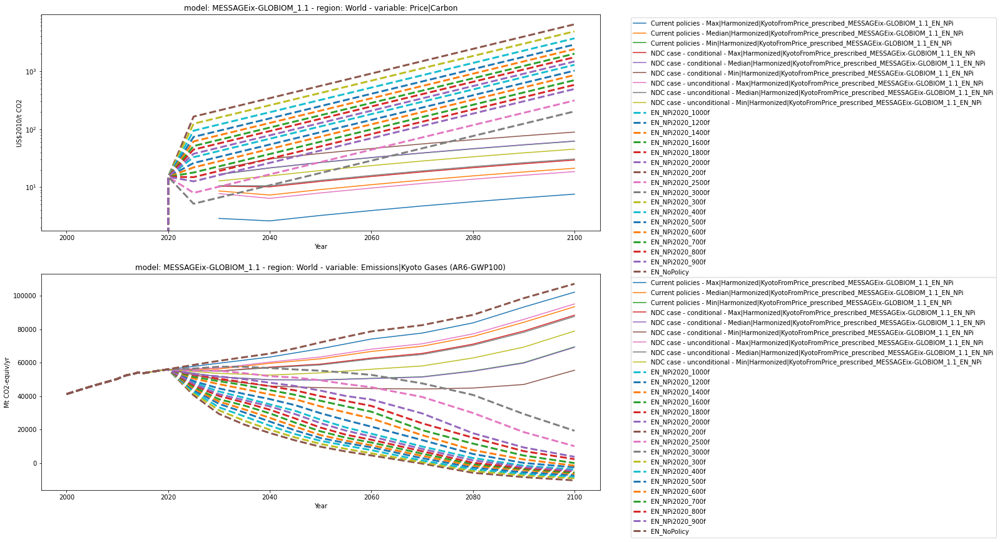

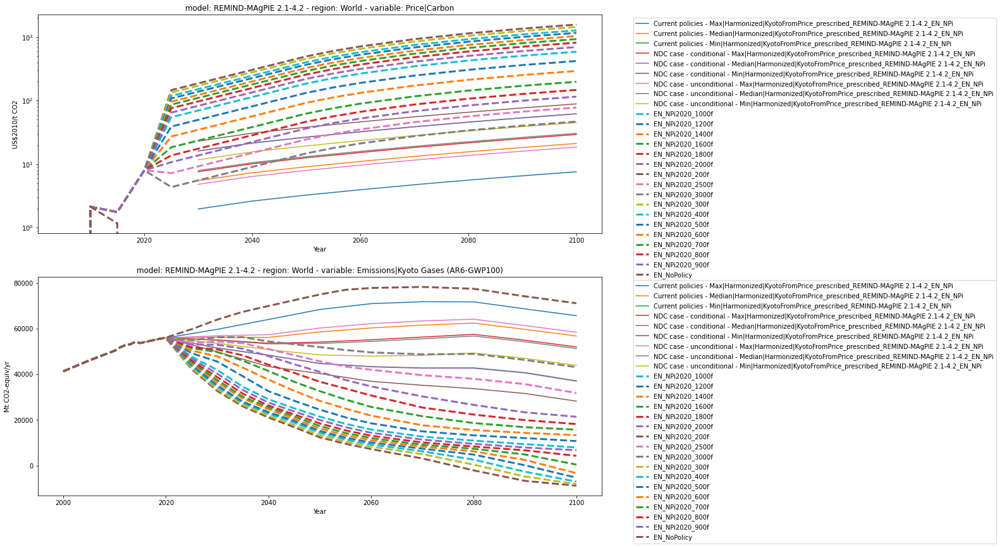

In [20]:
# We also investigate the effect of adding in a prescribed rate of 
# growth which mimics the growth in MESSAGE-GLOBIOM SSP2
prescribed_price_path = pd.read_excel(
    "../input/Carbon_price_prescribed_CAGR.xlsx", header=2, index_col=0
)
prescribed_price_path = prescribed_price_path.transpose()
all_prescribed = []
for (model, scenario, shortname) in mod_scen_list:
    price_kyoto_to_date = simplest_infill_data.filter(variable=price_kyoto_var).data.copy()
    if price_kyoto_var == kyexaf:
        presc_str = "|KyotoExAfFromPrice_prescribed" + "_" + model + "_" + shortname
    else:
        presc_str = "|KyotoFromPrice_prescribed" + "_" + model + "_" + shortname
    price_kyoto_to_date["scenario"] =  price_kyoto_to_date["scenario"] + presc_str
    prescribed_kyoto_prices = price_kyoto_to_date

    # We still need the historic data
    price_to_date = price_kyoto_to_date.copy()
    price_to_date["variable"] = price
    for year in price_to_date.year.unique():
        if year >= 2030:
            priceyear = harmed_sr15.filter(variable=[price, price_kyoto_var], model=model, scenario=scenario, year=year).data[[
                "scenario", "variable", "value"
            ]].pivot(
                index=["scenario"], columns="variable"
            ).fillna(0)
            locs = price_to_date.year == year
            price_to_date.loc[locs, "value"] = interpfunction(
                x=priceyear[("value", price_kyoto_var)], y=priceyear[("value", price)], 
                fill_value = (max(priceyear[("value", price)]), min(priceyear[("value", price)])), 
                bounds_error=False, kind=kindinterp
            )(price_to_date.loc[locs, "value"])
            price_to_date.loc[locs, "unit"] = price_unit
        else:
            price_to_date = price_to_date[price_to_date.year != year]
    prescribed_kyoto_prices = prescribed_kyoto_prices.append(price_to_date)

    # Then add the future info
    for year in list(range(2040, 2101, 10)):
        price_kyoto = simplest_infill_data.filter(year=2030, variable=price_kyoto_var).data.copy()
        price_kyoto["year"] = year
        price_kyoto["scenario"] =  price_kyoto["scenario"] + presc_str
        priceyear = harmed_sr15.filter(variable=[price, price_kyoto_var], model=model, scenario=scenario, year=year).data[[
            "scenario", "variable", "value"
        ]].pivot(
            index=["scenario"], columns="variable"
        ).fillna(0)
        price_df = price_kyoto.copy()
        price_df["variable"] = price
        price_df["unit"] = price_unit
        inflation = (1+prescribed_price_path[prescribed_price_path.index <= year]).product()[0]
        price_df["value"] = (all_carbon_prices[label] * inflation).tolist()
        price_kyoto["value"] = interpfunction(
            x=priceyear[("value", price)],
            y=priceyear[("value", price_kyoto_var)],
            fill_value = (max(priceyear[("value", price_kyoto_var)]), min(priceyear[("value", price_kyoto_var)])),
            kind=kindinterp
        )(price_df["value"])
        prescribed_kyoto_prices = prescribed_kyoto_prices.append(price_kyoto).append(price_df)
    plt.figure(figsize=(16,14))
    ax = plt.subplot(2, 1, 1)
    pyam.IamDataFrame(prescribed_kyoto_prices).filter(scenario="*" + presc_str, variable=price).plot(ax=ax)
    harmed_sr15.filter(model=model, region="World", scenario=scenario, variable=price).plot(ax=ax, linestyle="--", linewidth=3)
    plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.yscale("log")
    ax = plt.subplot(2, 1, 2)
    pyam.IamDataFrame(prescribed_kyoto_prices).filter(scenario="*" + presc_str, variable=price_kyoto_var).plot(ax=ax)
    harmed_sr15.filter(model=model, region="World", scenario=scenario, variable=price_kyoto_var).plot(
        ax=ax, linestyle="--", linewidth=3
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
    all_prescribed.append(prescribed_kyoto_prices)

pyam.plotting - INFO: >=13 labels, not applying legend


Running model MESSAGEix-GLOBIOM_1.1, scenario EN_NPi


pyam.plotting - INFO: >=13 labels, not applying legend
c:\users\rlamboll\constraincode\silicone\src\silicone\multiple_infillers\infill_all_required_emissions_for_openscm.py:191: UserWarning: No data for ['Emissions|PFC|C2F6', 'Emissions|PFC|C6F14', 'Emissions|HFC|HFC245ca'], it will be infilled with 0s
  unavailable_variables
silicone.database_crunchers.constant_ratio - INFO: <class 'silicone.database_crunchers.constant_ratio.ConstantRatio'> won't use any information from the database
Filling required variables: 100%|██████████████████████████████████████████████████████| 20/20 [00:02<00:00,  8.58it/s]
pyam.plotting - INFO: >=13 labels, not applying legend


Running model REMIND-MAgPIE 2.1-4.2, scenario EN_NPi


pyam.plotting - INFO: >=13 labels, not applying legend
c:\users\rlamboll\constraincode\silicone\src\silicone\multiple_infillers\infill_all_required_emissions_for_openscm.py:191: UserWarning: No data for ['Emissions|PFC|CF4', 'Emissions|PFC|C2F6', 'Emissions|PFC|C6F14', 'Emissions|HFC|HFC134a', 'Emissions|HFC|HFC143a', 'Emissions|HFC|HFC227ea', 'Emissions|HFC|HFC23', 'Emissions|HFC|HFC32', 'Emissions|HFC|HFC43-10', 'Emissions|HFC|HFC245ca', 'Emissions|HFC|HFC125'], it will be infilled with 0s
  unavailable_variables
silicone.database_crunchers.constant_ratio - INFO: <class 'silicone.database_crunchers.constant_ratio.ConstantRatio'> won't use any information from the database
Filling required variables: 100%|██████████████████████████████████████████████████████| 12/12 [00:01<00:00,  9.30it/s]
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'region: World - variable: Emissions|CH4'}, xlabel='Year', ylabel='Mt CH4/yr'>

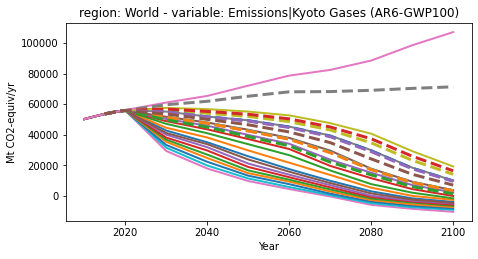

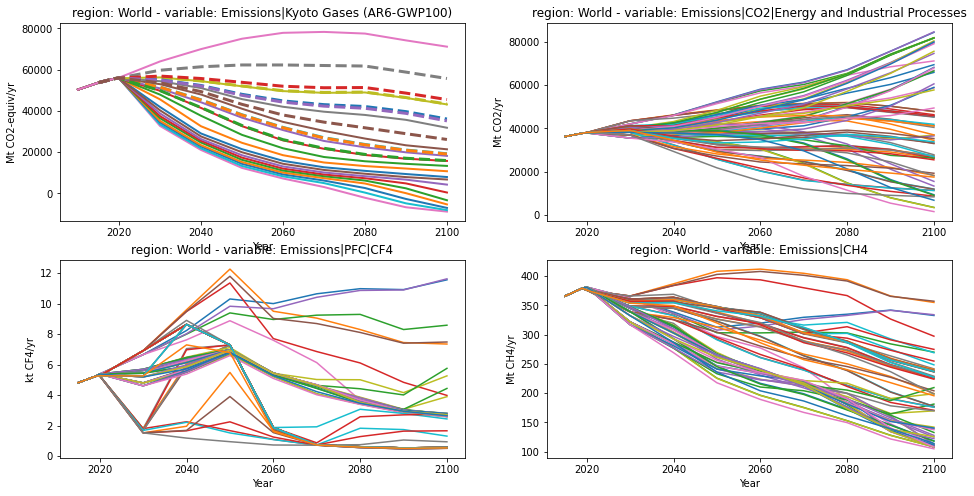

In [21]:
if price_kyoto_var == variable:
    non_co2_ind_compon = [
        co2afolu,
        "Emissions|CH4",
        "Emissions|N2O",
        "Emissions|F-Gases",
    ]    
else:
    non_co2_ind_compon = [
        "Emissions|CH4",
        "Emissions|N2O",
        "Emissions|F-Gases",
    ]
# Set up object to hold answers
try:
    del all_extensions
except:
    pass
fgas_em_inf = mi.DecomposeCollectionTimeDepRatio(harmed_sr15.filter(year=years, region="World"))
#logging.getLogger("pyam.core").setLevel(logging.CRITICAL)
for (model, scenario, shortname) in mod_scen_list:
    print ("Running model {}, scenario {}".format(model, shortname))
    infill_df = harmed_sr15.filter(model=model, scenario=scenario, year=years)
    extend_df = ExtendLatestTimeQuantile(infill_df).derive_relationship(variable=price_kyoto_var)(simplest_infill_data)
    extend_df = extend_df.append(simplest_infill_data)
    if price_kyoto_var == kyexaf:
        extend_co2afolu = ExtendLatestTimeQuantile(infill_df).derive_relationship(variable=co2afolu)(simplest_infill_data)
        extend_df = extend_df.append(extend_co2afolu)
    
    # Denote the process in the name
    extend_df = extend_df.data
    extend_df["scenario"] = extend_df["scenario"] + "|" + model + "_" + shortname + " kyoto extended"
    extend_df = pyam.IamDataFrame(extend_df)
    
    # Plot results to ensure they are reasonable
    plt.figure(figsize=(16,8))
    ax=plt.subplot(221)
    infill_df.filter(variable=price_kyoto_var).plot(ax=ax, linewidth=2)
    extend_df.filter(variable=price_kyoto_var).plot(ax=ax, linestyle="--", linewidth=3)
    
    # Add the price-infilled values for the same model/scenario
    price_mod_scen = pyam.IamDataFrame(all_kyoto_prices).filter(scenario="*" + model + "_" + shortname)
    if price_mod_scen:
        extend_df = extend_df.append(price_mod_scen)
    infill_results = infill_components_of_partial_aggregate(
        price_kyoto_var, extend_df, infill_df, non_co2_ind_compon, co2, co2ind, 
        co2afolu, fgas_em_inf, years, fgas, fgases, hfcs
    )
    try:
        all_extensions = all_extensions.append(pyam.IamDataFrame(infill_results))
    except NameError:
        all_extensions = pyam.IamDataFrame(infill_results)
#logging.getLogger("pyam.core").setLevel(logging.WARNING)
all_extensions = pyam.IamDataFrame(all_extensions.data)
ax=plt.subplot(222)
all_extensions.filter(variable=co2ind).plot(ax=ax)
ax=plt.subplot(223)
all_extensions.filter(variable="Emissions|PFC|CF4").plot(ax=ax)
ax=plt.subplot(224)
all_extensions.filter(variable="Emissions|CH4").plot(ax=ax)

In [22]:
harmed_sr15.filter(variable=fgas, year=[2010, 2015]).timeseries().head()

2010  \
model       scenario      region variable          unit                          
AIM/CGE 2.0 SSP1-26       World  Emissions|F-Gases Mt CO2-equiv/yr  926.198242   
            SSP1-34       World  Emissions|F-Gases Mt CO2-equiv/yr  926.198242   
            SSP1-45       World  Emissions|F-Gases Mt CO2-equiv/yr  926.198242   
            SSP1-Baseline World  Emissions|F-Gases Mt CO2-equiv/yr  926.198242   
            SSP4-26       World  Emissions|F-Gases Mt CO2-equiv/yr  926.198242   

                                                                           2015  
model       scenario      region variable          unit                          
AIM/CGE 2.0 SSP1-26       World  Emissions|F-Gases Mt CO2-equiv/yr  1137.700171  
            SSP1-34       World  Emissions|F-Gases Mt CO2-equiv/yr  1137.700171  
            SSP1-45       World  Emissions|F-Gases Mt CO2-equiv/yr  1137.700171  
            SSP1-Baseline World  Emissions|F-Gases Mt CO2-equiv/yr  1137.700171  
            SSP4-26       World  Emissions|F-Gases Mt CO2-equiv/yr  1137.700171

In [23]:
all_extensions

<class 'pyam.core.IamDataFrame'>
Index:
 * model    : Current policies, NDC case - conditional, NDC case - unconditional (3)
 * scenario : ... (24)
Timeseries data coordinates:
   region   : World (1)
   variable : Emissions|BC, Emissions|CH4, Emissions|CO, ... Price|Carbon (28)
   unit     : Mt BC/yr, Mt CH4/yr, Mt CO/yr, Mt CO2-equiv/yr, ... kt SF6/yr (22)
   year     : 2015, 2019, 2020, 2030, 2040, 2050, 2060, 2070, ... 2100 (11)
Meta indicators:
   exclude (bool) False (1)

In [24]:
all_extensions.variable

['Emissions|BC',
 'Emissions|CH4',
 'Emissions|CO',
 'Emissions|CO2',
 'Emissions|CO2|AFOLU',
 'Emissions|CO2|Energy and Industrial Processes',
 'Emissions|F-Gases',
 'Emissions|HFC',
 'Emissions|HFC|HFC125',
 'Emissions|HFC|HFC134a',
 'Emissions|HFC|HFC143a',
 'Emissions|HFC|HFC227ea',
 'Emissions|HFC|HFC23',
 'Emissions|HFC|HFC245ca',
 'Emissions|HFC|HFC32',
 'Emissions|HFC|HFC43-10',
 'Emissions|Kyoto Gases (AR6-GWP100)',
 'Emissions|N2O',
 'Emissions|NH3',
 'Emissions|NOx',
 'Emissions|OC',
 'Emissions|PFC|C2F6',
 'Emissions|PFC|C6F14',
 'Emissions|PFC|CF4',
 'Emissions|SF6',
 'Emissions|Sulfur',
 'Emissions|VOC',
 'Price|Carbon']

In [25]:
# Synthesize the Kyoto total (usually only required if variable != kyoto total)
kyoto_emissions = [
    'Emissions|CO2|Energy and Industrial Processes',
    'Emissions|CO2|AFOLU',
    'Emissions|CH4',
    'Emissions|N2O',
    'Emissions|SF6',
    'Emissions|PFC|*',
    'Emissions|HFC'
]
all_extensions_kyoto = _construct_consistent_values(
    variable, kyoto_emissions, convert_units_to_MtCO2_equiv(
        all_extensions.filter(variable=kyoto_emissions), metric_name="AR6GWP100"
    )
)

In [26]:
tmp = all_extensions_kyoto.filter(year=2015).data
assert np.allclose(tmp.value.unique(), tmp.value[0])
assert pyam.compare(all_extensions_kyoto.filter(year=2030), 
                 all_extensions.filter(year=2030, variable=variable), drop_close=True).size == 0

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'region: World - variable: Emissions|Kyoto Gases (AR6-GWP100)'}, xlabel='Year', ylabel='Mt CO2-equiv/yr'>

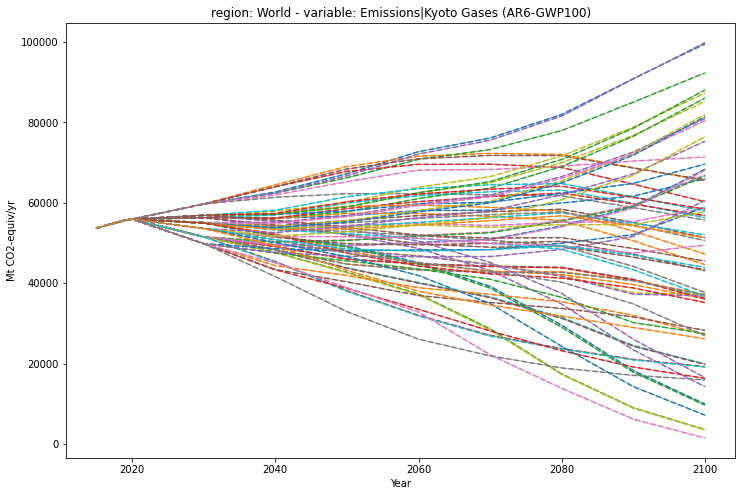

In [27]:
plt.figure(figsize=(12,8))
ax = plt.subplot(111)
all_extensions.filter(variable=variable).plot(ax=ax, linewidth = 0.5)
plt.gca().set_prop_cycle(None)
all_extensions_kyoto.plot(linestyle="--", ax=ax)

In [28]:
all_extensions = all_extensions.filter(variable=variable, keep=False).append(all_extensions_kyoto)

# Plot and investigate

In [29]:
assert all_extensions.check_aggregate(co2) == None

In [30]:
assert all_extensions.check_aggregate_region(co2) == None

pyam.aggregation - INFO: Cannot aggregate variable 'Emissions|CO2' to 'World' because it does not exist in any subregion!


pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'region: World - variable: Emissions|CO2'}, xlabel='Year', ylabel='Mt CO2/yr'>

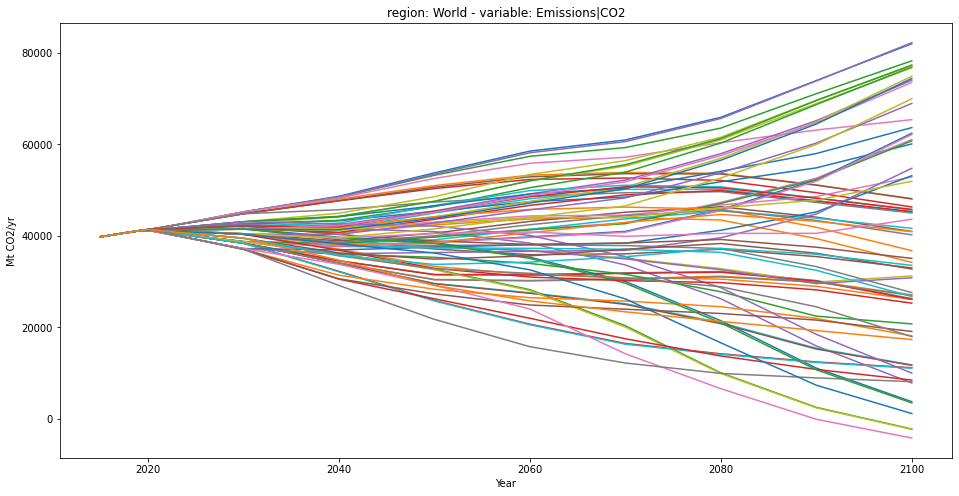

In [31]:
plt.figure(figsize=(16,8))
ax=plt.subplot(111)
all_extensions.filter(variable=co2, region="World").plot(ax=ax)

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


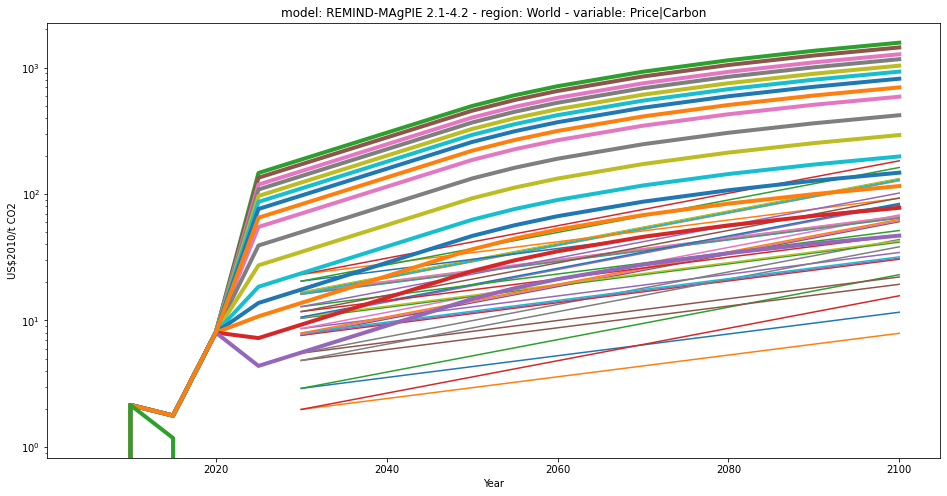

In [32]:
plt.figure(figsize=(16,8))
ax=plt.subplot(111)
all_extensions.filter(variable=price, scenario="*incr*").plot(ax=ax)
harmed_sr15.filter(variable=price, model=model, scenario=scenario).plot(ax=ax, linewidth=4)
plt.yscale("log")

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'model: REMIND-MAgPIE 2.1-4.2 - region: World - variable: Emissions|Kyoto Gases (AR6-GWP100)'}, xlabel='Year', ylabel='Mt CO2-equiv/yr'>

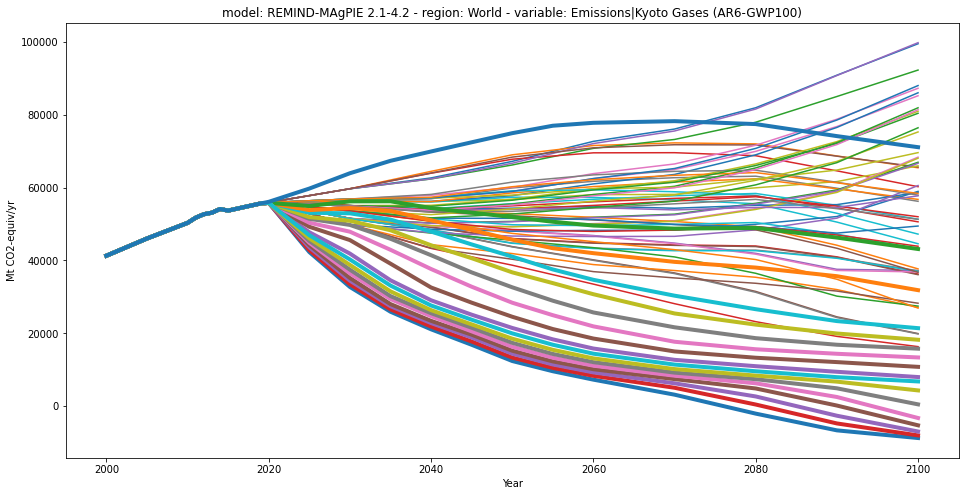

In [33]:
plt.figure(figsize=(16,8))
ax=plt.subplot(111)
all_extensions.filter(variable=price_kyoto_var).filter(scenario=["*incr*", "*_prescribed*"]).plot(ax=ax)
harmed_sr15.filter(variable=price_kyoto_var, model=model, scenario=scenario).plot(ax=ax, linewidth=4)

In [34]:
assert len(all_extensions.filter(variable="Emissions|SF6", year=2015).data.value.unique()) == 1

pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'region: World - variable: Emissions|SF6'}, xlabel='Year', ylabel='kt SF6/yr'>

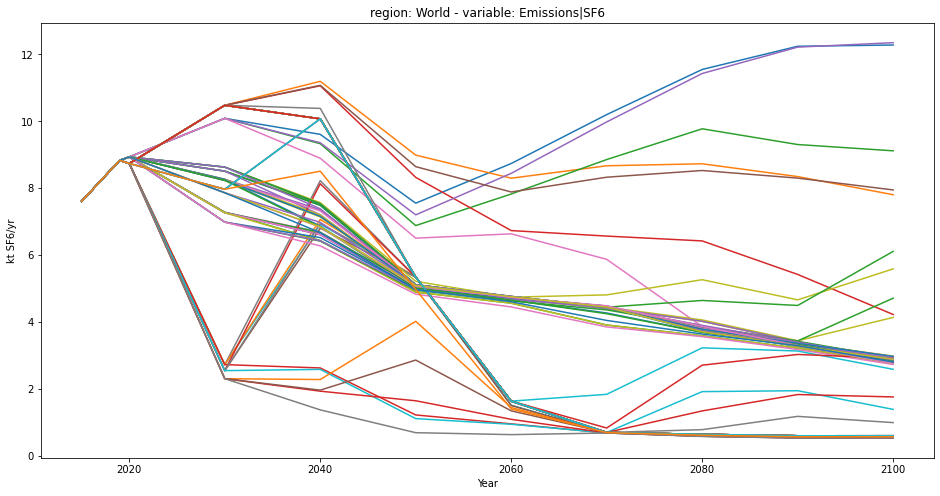

In [35]:
plt.figure(figsize=(16,8))
ax=plt.subplot(111)
all_extensions.filter(variable="Emissions|SF6").plot(ax=ax)

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'region: World - variable: Emissions|F-Gases'}, xlabel='Year', ylabel='Mt CO2-equiv/yr'>

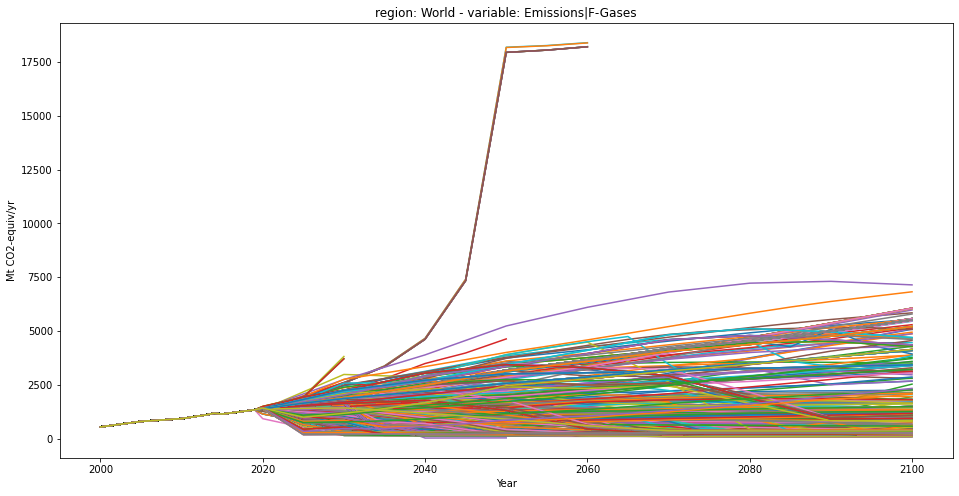

In [36]:
plt.figure(figsize=(16,8))
ax=plt.subplot(111)
all_extensions.filter(variable="Emissions|F-Gases").plot(ax=ax)
harmed_sr15.filter(variable="Emissions|F-Gases").plot(ax=ax)

In [37]:
all_extensions.filter(variable="Emissions|F-Gases").model

['Current policies', 'NDC case - conditional', 'NDC case - unconditional']

pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'region: World - variable: Emissions|Kyoto Gases (AR6-GWP100)'}, xlabel='Year', ylabel='Mt CO2-equiv/yr'>

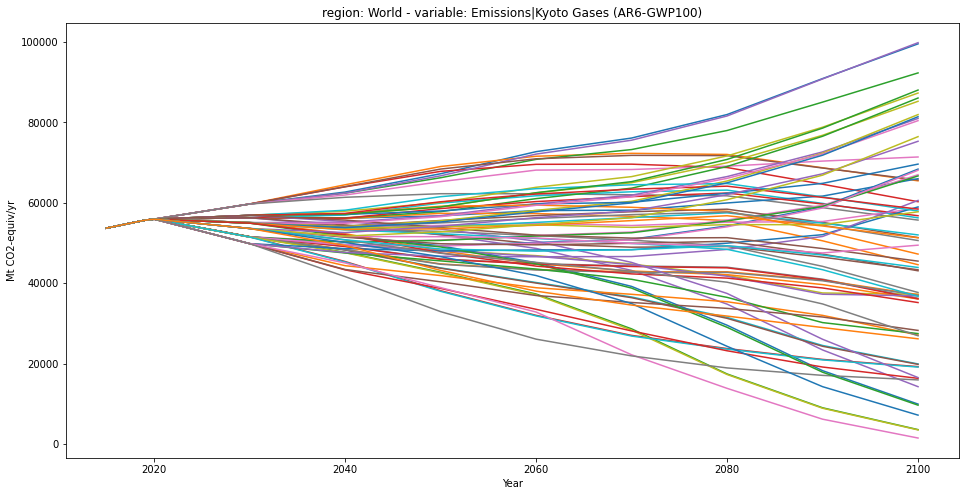

In [38]:
plt.figure(figsize=(16,8))
ax=plt.subplot(111)
all_extensions.filter(variable=variable).plot(ax=ax)

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'region: World - variable: Emissions|NOx'}, xlabel='Year', ylabel='Mt NO2/yr'>

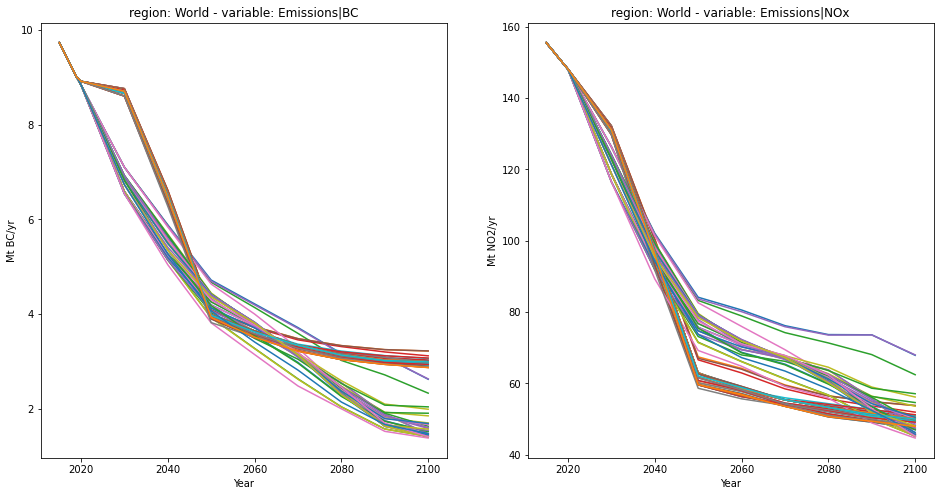

In [39]:
plt.figure(figsize=(16, 8))
ax=plt.subplot(121)
all_extensions.filter(variable="Emissions|BC").plot(ax=ax)
ax=plt.subplot(122)
all_extensions.filter(variable="Emissions|NOx").plot(ax=ax)

In [40]:
# Rename an awkward unit
all_extensions = all_extensions.data
vars_to_convert = [
    "HFC245ca", "C6F14"
]
for var in vars_to_convert:
    ind = [var in y for y in all_extensions["variable"]]
    assert (all_extensions.iloc[ind].value == 0).all()
    index = all_extensions[ind].index
    all_extensions.loc[index, "unit"] = all_extensions.loc[index, "unit"].str.replace(
        "Mt CO2-equiv", "kt " + var)
all_extensions = pyam.IamDataFrame(all_extensions)

In [41]:
all_extensions_orig = all_extensions.copy()

# Effects of net zero
To investigate the effects of net zero, we must estimate the fraction of the data coming from specific regions. This takes the following steps: 
1) Infill each region from the global totals for the whole timeseries (note that this uses the ratios of emissions without harmonisation)

2) Calculate the fraction of each region that corresponds to a country using the CAIT database for 2020

3) Take the subset of countries with 2030 agreements and take their fractions of the regional Kyoto totals to 0

We only want to do this to the scenarios that did not originally extend beyond 2030

In [42]:
regions = harmed_sr15_regions.region
regions = [reg for reg in regions if reg not in ["R10ROWO", "World"]]
regions

['R10AFRICA',
 'R10CHINA+',
 'R10EUROPE',
 'R10INDIA+',
 'R10LATIN_AM',
 'R10MIDDLE_EAST',
 'R10NORTH_AM',
 'R10PAC_OECD',
 'R10REF_ECON',
 'R10REST_ASIA']

In [43]:
harmed_sr15_regions.filter(variable=co2afolu, region="R10CHINA+").filter(year=2030).data

,model,scenario,region,variable,unit,year,value
0,MESSAGEix-GLOBIOM_1.1,EN_INDCi2030_1000,R10CHINA+,Emissions|CO2|AFOLU,Mt CO2/yr,2030,-106.356483
1,MESSAGEix-GLOBIOM_1.1,EN_INDCi2030_1000_COV,R10CHINA+,Emissions|CO2|AFOLU,Mt CO2/yr,2030,-106.356483
2,MESSAGEix-GLOBIOM_1.1,EN_INDCi2030_1000_COV_NDCp,R10CHINA+,Emissions|CO2|AFOLU,Mt CO2/yr,2030,-106.356483
3,MESSAGEix-GLOBIOM_1.1,EN_INDCi2030_1000_NDCp,R10CHINA+,Emissions|CO2|AFOLU,Mt CO2/yr,2030,-106.356483
4,MESSAGEix-GLOBIOM_1.1,EN_INDCi2030_1000f,R10CHINA+,Emissions|CO2|AFOLU,Mt CO2/yr,2030,-106.356483
...,...,...,...,...,...,...,...
271,REMIND-MAgPIE 2.1-4.2,SusDev_SSP1-NPi,R10CHINA+,Emissions|CO2|AFOLU,Mt CO2/yr,2030,36.039400
272,REMIND-MAgPIE 2.1-4.2,SusDev_SSP1-PkBudg900,R10CHINA+,Emissions|CO2|AFOLU,Mt CO2/yr,2030,-55.588700
273,REMIND-MAgPIE 2.1-4.2,SusDev_SSP2-NDC,R10CHINA+,Emissions|CO2|AFOLU,Mt CO2/yr,2030,-152.901400
274,REMIND-MAgPIE 2.1-4.2,SusDev_SSP2-NPi,R10CHINA+,Emissions|CO2|AFOLU,Mt CO2/yr,2030,19.178800


In [44]:
last_infill_region="R10LATIN_AM"

try:
    del regions_added
except:
    pass

def swap_region_into_var(df):
    sr15_all_regswap = df.data
    sr15_all_regswap["variable"] = sr15_all_regswap["variable"] + "_" + sr15_all_regswap["region"]
    sr15_all_regswap["region"] = "suspend"
    return pyam.IamDataFrame(sr15_all_regswap)

def split_regions_off(df):
    df = df.data
    df.region = ["_".join(s.split("_")[1:]) for s in df.variable]
    df.variable = [s.split("_")[0] for s in df.variable]
    return pyam.IamDataFrame(df)
    

for (model, scenario, shortname) in mod_scen_list:
    # Manipulate the info on regions into the variable name in the all-regions database
    sr15_all_regswap_var = set(harmed_sr15_regions.filter(scenario=scenario, model=model).variable.copy()) - set([co2afolu])
    sr15_all_regswap = swap_region_into_var(harmed_sr15_regions.filter(scenario=scenario, model=model))
    regional_downscaler = mi.DecomposeCollectionTimeDepRatio(sr15_all_regswap)
    regional_remainder_downscaler = mi.SplitCollectionWithRemainderEmissions(sr15_all_regswap)

    # find the appropriate aspect of the database to be infilled and rename it
    region_to_infill = all_extensions_orig.filter(scenario="*" + model + "*" + shortname + "*")
    region_to_infill_variables = region_to_infill.variable
    region_to_infill = swap_region_into_var(region_to_infill)
    
    # Infill all times
    # CO2 AFOLU is infilled using remainders as we have a sign difference in the target database in 2030. Latin America
    # has the highest uncertainty and so is infilled last
    new_regional = regional_remainder_downscaler.infill_components(
        co2afolu + "_World", 
        [co2afolu + "_" + reg for reg in regions if reg != last_infill_region], 
        co2afolu + "_" + last_infill_region,
        region_to_infill,
        metric_name="AR6GWP100"
    )
    try:
        regions_added = regions_added.append(new_regional)
    except NameError:
        regions_added = new_regional.copy()
    for var in regional_emtype:
        if var in sr15_all_regswap_var:
            # This will produce an irritating number of warnings about negative values
            sys.stdout = open(os.devnull, 'w')
            new_regional = regional_downscaler.infill_components(
                var + "_World", [var + "_" + reg for reg in regions], 
                region_to_infill.filter(variable=var+"_*")
            )
            sys.stdout = stdout
            regions_added = regions_added.append(new_regional)

regions_added = split_regions_off(regions_added)

In [45]:
assert all([r in harmed_sr15_regions.region for r in regions_added.region])

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'model: REMIND-MAgPIE 2.1-4.2 - region: R10EUROPE - variable: Emissions|CO2|AFOLU'}, xlabel='Year', ylabel='Mt CO2/yr'>

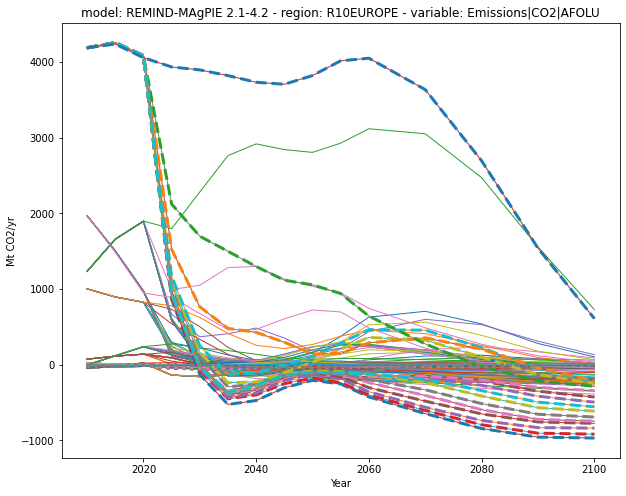

In [46]:
plt.figure(figsize = (10, 8))
ax = plt.subplot(111)
harmed_sr15_regions.filter(variable='Emissions|CO2|AFOLU', model=model, scenario=scenario).plot(ax=ax, linewidth=1)
harmed_sr15_regions.filter(
    variable='Emissions|CO2|AFOLU', model=model, scenario=scenario, region="World").plot(ax=ax, linestyle="--", linewidth=3)
harmed_sr15_regions.filter(
    variable='Emissions|CO2|AFOLU', model=model, scenario=scenario, region="R10EUROPE").plot(ax=ax, linestyle=":", linewidth=3)

pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'variable: Emissions|CO2|AFOLU'}, xlabel='Year', ylabel='Mt CO2/yr'>

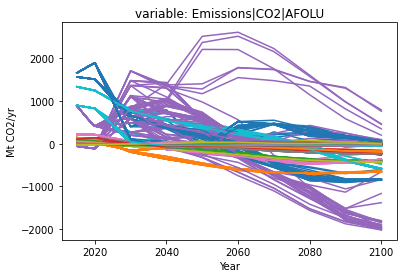

In [47]:
regions_added.filter(variable=co2afolu).plot()

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'model: REMIND-MAgPIE 2.1-4.2 - region: suspend - variable: Emissions|CO2|AFOLU_World'}, xlabel='Year', ylabel='Mt CO2/yr'>

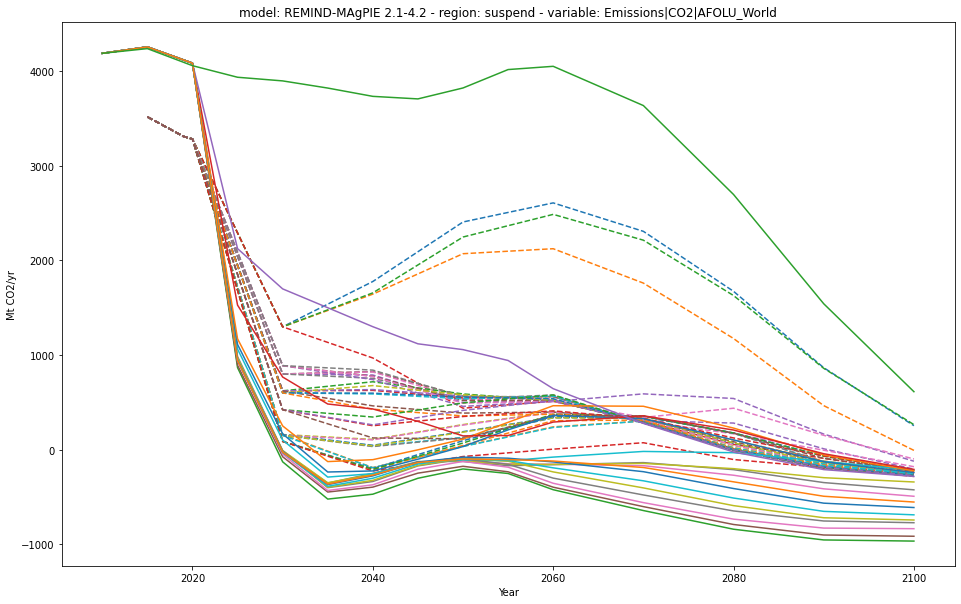

In [48]:
plt.figure(figsize = (16, 10))
ax = plt.subplot(111)
region_to_infill.filter(variable='Emissions|CO2|AFOLU_World').plot(ax=ax, linestyle="--")
sr15_all_regswap.filter(variable='Emissions|CO2|AFOLU_World').plot(ax=ax)

In [49]:
kyoto = "Emissions|Kyoto Gases (AR6-GWP100)"
regions_kyoto = _construct_consistent_values(
    kyoto, regional_emtype, convert_units_to_MtCO2_equiv(regions_added, metric_name="AR6GWP100")
)

pyam.plotting - INFO: >=13 labels, not applying legend


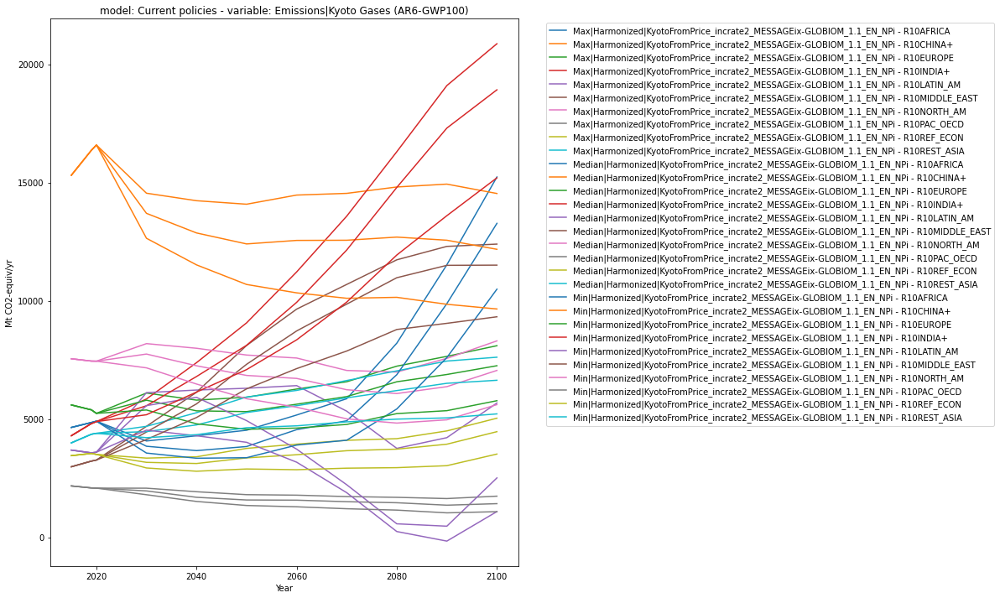

In [50]:
fig = plt.figure(figsize=(10,12))
ax = plt.subplot(1, 1, 1)
regions_kyoto.filter(scenario="*Kyoto*incrate2*MESSAGE*", model="Current policies").plot(ax=ax)
plt.legend( bbox_to_anchor=(1.05, 1), loc='upper left')

## Check regional split

In [51]:
assert regions_added.check_aggregate_region(variable="Emissions|N2O") == None
assert regions_kyoto.check_aggregate_region(variable=kyoto) == None

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'variable: Emissions|Kyoto Gases (AR6-GWP100)'}, xlabel='Year', ylabel='Mt CO2-equiv/yr'>

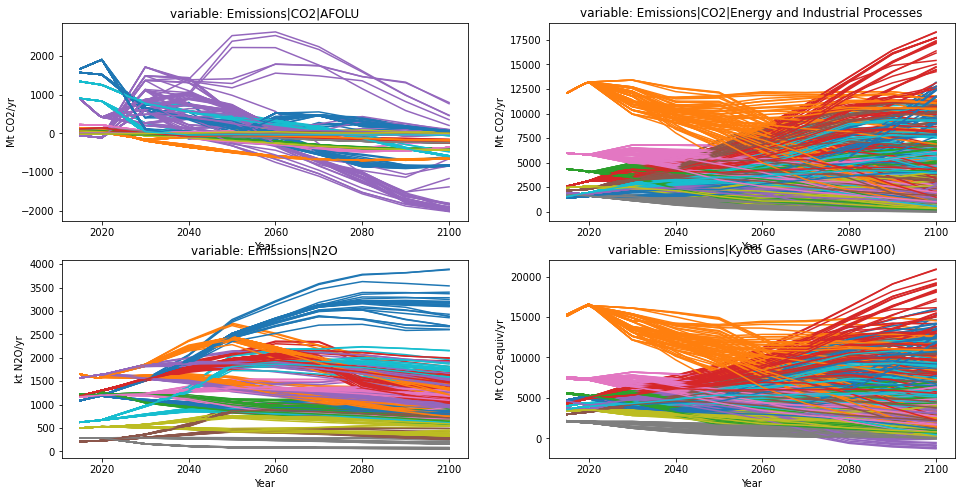

In [52]:
plt.figure(figsize=(16, 8))
ax = plt.subplot(2, 2, 1)
regions_added.filter(variable="*CO2|AFOLU").plot(ax=ax)
ax = plt.subplot(2, 2, 2)
regions_added.filter(variable=co2ind).plot(ax=ax)
ax=plt.subplot(2, 2, 3)
regions_added.filter(variable="*N2O").plot(ax=ax)
ax=plt.subplot(2, 2, 4)
regions_kyoto.filter(variable=kyoto).plot(ax=ax)

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'model: MESSAGEix-GLOBIOM_1.1 - region: R10EUROPE - variable: Emissions|CO2|AFOLU'}, xlabel='Year', ylabel='Mt CO2/yr'>

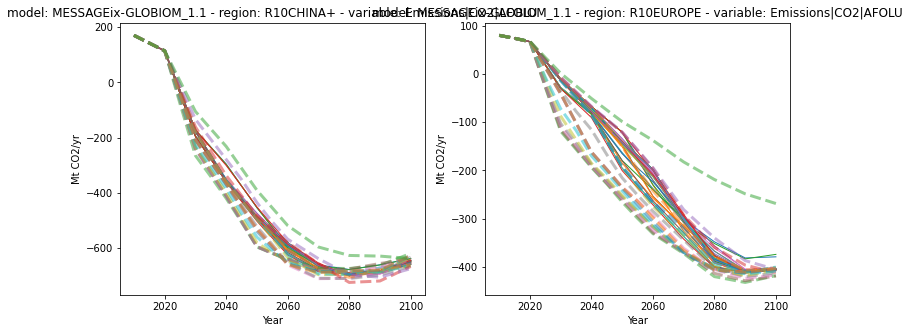

In [53]:
# Asia has a sudden negative lurch in AFOLU in some models, but not in MESSAGE. 
plt.figure(figsize=(12, 5))
ax = plt.subplot(121)
regions_added.filter(variable="*CO2|AFOLU", scenario="*MESSAGE*").filter(region="R10CHINA+").plot(ax=ax, linewidth=1)
harmed_sr15_regions.filter(
    variable="Emissions|CO2|AFOLU", scenario=scenario, model="MESSAGE*", region="R10CHINA+"
).plot(ax=ax, linewidth=3, alpha=0.5, linestyle="--")
ax=plt.subplot(122)
regions_added.filter(variable="*CO2|AFOLU", scenario="*MESSAGE*").filter(region="R10EUROPE").plot(ax=ax, linewidth=1)
harmed_sr15_regions.filter(
    variable="Emissions|CO2|AFOLU", scenario=scenario, model="MESSAGE*", region="R10EUROPE"
).plot(ax=ax, linewidth=3, alpha=0.5, linestyle="--")

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'model: MESSAGEix-GLOBIOM_1.1 - region: R10CHINA+ - variable: Emissions|CO2|Energy and Industrial Processes'}, xlabel='Year', ylabel='Mt CO2/yr'>

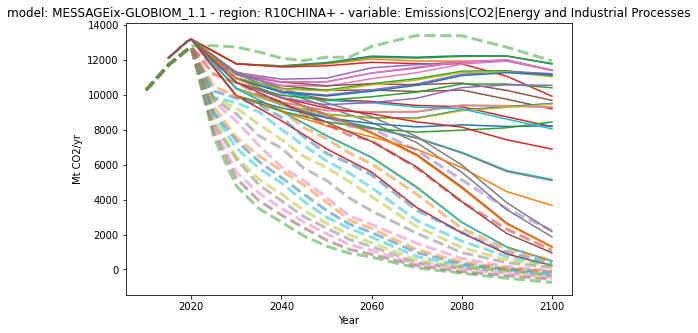

In [54]:
plt.figure(figsize=(8, 5))
ax = plt.subplot(111)
regions_added.filter(variable=co2ind, scenario="*MESSAGE*").filter(region="R10CHINA+").plot(ax=ax)
harmed_sr15_regions.filter(variable=co2ind, scenario=scenario, model="MESSAGE*", region="R10CHINA+").plot(
    ax=ax, linewidth=3, alpha=0.5, linestyle="--")

In [55]:
regions_added.model

['Current policies', 'NDC case - conditional', 'NDC case - unconditional']

## Import CAIT data
This comes in two parts, with and without LUCF

In [56]:
convert_country = country_converter.CountryConverter()

In [57]:
r10regions = pd.read_csv("../input/iso3c_region_mapping_2.csv")

In [58]:
region_map = {
    "AFR": 'R10AFRICA',
    "EAS": 'R10CHINA+',
    "EUR": 'R10EUROPE',
    "SAS": 'R10INDIA+',
    "LAM": 'R10LATIN_AM',
    "MEA": 'R10MIDDLE_EAST',
    "NAM": 'R10NORTH_AM',
    "PAO": 'R10PAC_OECD',
    "FSU": 'R10REF_ECON',
    "PAS": 'R10REST_ASIA',
}

In [59]:
cait_folder = "../input/CAIT/"
cait_data = pd.read_csv(
    cait_folder + "historical_emissions.csv"
)
cait_data["variable"] = variable
cait_data = cait_data.loc[cait_data.Country != "World", :]
cait_data["iso3"] = convert_country.convert(cait_data["Country"])
cait_data.loc[cait_data.Country == "European Union (27)", "iso3"] = "EU"
cait_data["region"] = [
    region_map[r10regions.loc[r10regions.iso3c==iso3, "iamc_r10"].iloc[0]] if (iso3!= "EU") else "temp" for iso3 in cait_data["iso3"]
]

country_converter.country_converter - WARNING: European Union (27) not found in regex


In [60]:
# Add EU membership data.
cait_data["eu_membership"] = convert_country.convert(cait_data.iso3, to="EU27")
# Europe itself should be listed too! (But doesn't have a region associated, to prevent double-counting)
cait_data.loc[cait_data.Country == "European Union (27)", "eu_membership"] = "EU27"

country_converter.country_converter - WARNING: EU not found in ISO2


In [61]:
region_totals = cait_data.groupby(["region", "variable"])["2019"].sum()
region_totals = region_totals.reset_index("variable")["2019"]
region_totals

region
R10AFRICA          4507.03
R10CHINA+         12849.91
R10EUROPE          4223.62
R10INDIA+          4158.81
R10LATIN_AM        4039.03
R10MIDDLE_EAST     2820.63
R10NORTH_AM        6545.29
R10PAC_OECD        1815.53
R10REF_ECON        2950.89
R10REST_ASIA       4018.03
temp               3149.57
Name: 2019, dtype: float64

In [62]:
# Now we can relabel Europe as part of R10Europe
cait_data.loc[cait_data.iso3=="EU", "region"] = "R10EUROPE"

In [63]:
cait_data["region_fraction"] = cait_data["2019"].values / region_totals[cait_data["region"]].values
cait_data.head(10)

,Country,Data source,Sector,Gas,Unit,2019,2018,2017,2016,2015,...,1994,1993,1992,1991,1990,variable,iso3,region,eu_membership,region_fraction
1,China,CAIT,Total including LUCF,All GHG,MtCO₂e,12055.41,11821.66,11385.48,11151.31,11108.86,...,3557.37,3397.80,3168.05,3039.15,2891.73,Emissions|Kyoto Gases (AR6-GWP100),CHN,R10CHINA+,NaN,0.938171
2,United States,CAIT,Total including LUCF,All GHG,MtCO₂e,5771.00,5892.37,5689.61,5743.85,5665.21,...,5661.57,5567.55,5456.12,5372.08,5417.32,Emissions|Kyoto Gases (AR6-GWP100),USA,R10NORTH_AM,NaN,0.881703
3,India,CAIT,Total including LUCF,All GHG,MtCO₂e,3363.60,3360.56,3215.07,3076.48,3003.07,...,1158.48,1114.22,1081.28,1056.25,1002.56,Emissions|Kyoto Gases (AR6-GWP100),IND,R10INDIA+,NaN,0.808789
4,European Union (27),CAIT,Total including LUCF,All GHG,MtCO₂e,3149.57,3295.53,3379.38,3364.77,3019.49,...,3894.63,3908.95,3981.08,4120.94,4187.90,Emissions|Kyoto Gases (AR6-GWP100),EU,R10EUROPE,EU27,0.745704
5,Indonesia,CAIT,Total including LUCF,All GHG,MtCO₂e,1959.71,1692.36,1447.22,1434.46,2067.75,...,1302.70,1282.35,1266.98,1246.27,1226.82,Emissions|Kyoto Gases (AR6-GWP100),IDN,R10REST_ASIA,NaN,0.487729
6,Russia,CAIT,Total including LUCF,All GHG,MtCO₂e,1924.82,1868.15,1769.69,1733.91,1602.81,...,1995.87,2233.86,2428.18,2585.28,2648.36,Emissions|Kyoto Gases (AR6-GWP100),RUS,R10REF_ECON,NaN,0.652285
7,Brazil,CAIT,Total including LUCF,All GHG,MtCO₂e,1451.63,1434.51,1475.82,1455.86,1366.89,...,1697.94,1681.12,1669.79,1659.83,1638.68,Emissions|Kyoto Gases (AR6-GWP100),BRA,R10LATIN_AM,NaN,0.359401
8,Japan,CAIT,Total including LUCF,All GHG,MtCO₂e,1134.45,1172.32,1214.59,1229.82,1220.73,...,1185.98,1128.24,1134.81,1121.71,1106.26,Emissions|Kyoto Gases (AR6-GWP100),JPN,R10PAC_OECD,NaN,0.624859
9,Iran,CAIT,Total including LUCF,All GHG,MtCO₂e,893.78,925.58,912.77,881.05,844.14,...,394.82,362.41,354.38,332.58,304.22,Emissions|Kyoto Gases (AR6-GWP100),IRN,R10MIDDLE_EAST,NaN,0.316872
10,Canada,CAIT,Total including LUCF,All GHG,MtCO₂e,774.29,776.50,757.38,740.67,841.22,...,631.24,613.16,617.15,602.81,606.91,Emissions|Kyoto Gases (AR6-GWP100),CAN,R10NORTH_AM,NaN,0.118297


## Import latest net zero commitments
These are used to construct the expected evolution towards zero emissions


In [64]:
nzcoms = pd.read_excel(
    "../input/Analysis_update_ImplementationProgress_EGR2023_master_finalUpdateCheck.xlsx", 
    header=[2], sheet_name="September 2023 Update (WRI)"
)
fewercols = True
if not fewercols:
    nzcoms = nzcoms.rename(columns={"Unnamed: 0": "Country"})
nzcoms.head(10)

,Unnamed: 0,Country,Unit,Year,Total,2020,Year.1,Total.1,Year.2,"Emissions (MtCO2e/yr, 2019)",Net zero target applicable to,CAT,NZT,Suggested coding,10% below 2020,0.1
0,1.0,Argentina,MtCO2e/yr,2016.0,378.0,390.0,2030.0,375.0,2050,398.91,GHG,Weak,No plan,Weaker,n,weak
1,1.0,Australia,MtCO2e/yr,2020.0,503.0,508.0,2030.0,347.0,2050,608.49,GHG,Weak,Complete,Credible,n,weak
2,1.0,Brazil,MtCO2e/yr,2018.0,1366.0,1568.0,2030.0,1268.0,2050,1451.63,UNCLEAR,No plan,No plan,None,n,weak
3,1.0,Canada,MtCO2e/yr,2020.0,638.0,642.0,2030.0,427.0,2050,774.29,GHG,Better,Incomplete,Weaker,n,weak
4,1.0,China,MtCO2e/yr,2018.0,12233.0,12935.0,2030.0,14092.0,2060,12055.41,CO2,Better,Incomplete,Weaker,n,weak
5,1.0,European Union,MtCO2e/yr,2020.0,3043.0,3046.0,2030.0,2146.0,2050,3149.57,GHG,Comprehensive,No analysis,Credible,y,stronger
6,1.0,India,MtCO2e/yr,2018.0,2692.0,3027.0,2030.0,4934.0,2070,3363.59,UNCLEAR,Weak,No plan,Weaker,n,weak
7,1.0,Indonesia,MtCO2e/yr,2016.0,1491.0,1645.0,2030.0,2130.0,2060,1959.71,UNCLEAR,No plan,Incomplete,Weaker,n,weak
8,1.0,Japan,MtCO2e/yr,2020.0,1070.0,1082.0,2030.0,767.0,2050,1134.45,GHG,Better,No plan,Weaker,n,weak
9,1.0,Mexico,MtCO2e/yr,2017.0,577.0,658.0,2030.0,772.0,2050,670.84,NOTARGET,NaN,NaN,NaN,n,weak


In [65]:
if not fewercols:
    # The structure of the table has changed to add a current policy column. We remove this for comparability 
    # with the previous protocol.
    assert "Total.3" in nzcoms.columns
    nzcoms["Total.2"] = nzcoms["Total.3"]
    del nzcoms["Total.3"]
    confidence_cols = ["0.1.1"]
else:
    assert "Total.2" not in nzcoms.columns
    nzcoms["Total.2"] = 0
    confidence_cols = [0.1]
col2030 = "Total.1"
currentcol = 2020

In [66]:
nzcoms = nzcoms.rename(columns={"Unnamed: 1": "iso3"})

In [67]:
# Remove irrelevant items
nzcoms = nzcoms.iloc[[x not in ["No NetZero target", "No NDC data"] for x in nzcoms[currentcol].values]]
nzcoms = nzcoms.iloc[[x not in ["No NetZero target", "No NDC data"] for x in nzcoms["Total.1"].values]]
nzcoms = nzcoms.iloc[[x not in ["No NetZero target", "No NDC data"] for x in nzcoms["Total.2"].values]]
nzcoms = nzcoms.iloc[[x not in ["No NetZero target", "No NDC data"] for x in nzcoms["Year.2"].values]]
nzcoms = nzcoms[nzcoms[col2030].apply(lambda x: not isinstance(x, str))]
nzcoms = nzcoms[nzcoms["Country"].apply(lambda x: isinstance(x, str))]

nzcoms["iso3"] = convert_country.convert(nzcoms["Country"], to="iso3")
assert len(nzcoms.loc[nzcoms["iso3"] == "not found", "iso3"]) == 1
nzcoms.loc[nzcoms["iso3"] == "not found", "iso3"] = "EU"
# TODO: fix
nzcoms["region"] = [
    region_map[r10regions.loc[r10regions.iso3c==iso3, "iamc_r10"].iloc[0]] if iso3!= "EU" else "R10EUROPE" for iso3 in nzcoms["iso3"]]
nzcoms

country_converter.country_converter - WARNING: European Union not found in regex


,Unnamed: 0,Country,Unit,Year,Total,2020,Year.1,Total.1,Year.2,"Emissions (MtCO2e/yr, 2019)",Net zero target applicable to,CAT,NZT,Suggested coding,10% below 2020,0.1,Total.2,iso3,region
0,1.0,Argentina,MtCO2e/yr,2016.0,378.0,390.0,2030.0,375.00,2050,398.91,GHG,Weak,No plan,Weaker,n,weak,0,ARG,R10LATIN_AM
1,1.0,Australia,MtCO2e/yr,2020.0,503.0,508.0,2030.0,347.00,2050,608.49,GHG,Weak,Complete,Credible,n,weak,0,AUS,R10PAC_OECD
2,1.0,Brazil,MtCO2e/yr,2018.0,1366.0,1568.0,2030.0,1268.00,2050,1451.63,UNCLEAR,No plan,No plan,None,n,weak,0,BRA,R10LATIN_AM
3,1.0,Canada,MtCO2e/yr,2020.0,638.0,642.0,2030.0,427.00,2050,774.29,GHG,Better,Incomplete,Weaker,n,weak,0,CAN,R10NORTH_AM
4,1.0,China,MtCO2e/yr,2018.0,12233.0,12935.0,2030.0,14092.00,2060,12055.41,CO2,Better,Incomplete,Weaker,n,weak,0,CHN,R10CHINA+
5,1.0,European Union,MtCO2e/yr,2020.0,3043.0,3046.0,2030.0,2146.00,2050,3149.57,GHG,Comprehensive,No analysis,Credible,y,stronger,0,EU,R10EUROPE
6,1.0,India,MtCO2e/yr,2018.0,2692.0,3027.0,2030.0,4934.00,2070,3363.59,UNCLEAR,Weak,No plan,Weaker,n,weak,0,IND,R10INDIA+
7,1.0,Indonesia,MtCO2e/yr,2016.0,1491.0,1645.0,2030.0,2130.00,2060,1959.71,UNCLEAR,No plan,Incomplete,Weaker,n,weak,0,IDN,R10REST_ASIA
8,1.0,Japan,MtCO2e/yr,2020.0,1070.0,1082.0,2030.0,767.00,2050,1134.45,GHG,Better,No plan,Weaker,n,weak,0,JPN,R10PAC_OECD
9,1.0,Mexico,MtCO2e/yr,2017.0,577.0,658.0,2030.0,772.00,2050,670.84,NOTARGET,NaN,NaN,NaN,n,weak,0,MEX,R10LATIN_AM


In [68]:
cait_str = "Emissions (MtCO2e/yr, 2019)"

In [69]:
nzcoms["region_fraction"] = nzcoms[cait_str].values / region_totals[nzcoms["region"]].values

In [70]:
for col in confidence_cols:
    nzcoms[col] = [x if x==x else "much lower" for x in nzcoms[col]]

In [71]:
nzcoms_copy = nzcoms.copy()
nzcoms

,Unnamed: 0,Country,Unit,Year,Total,2020,Year.1,Total.1,Year.2,"Emissions (MtCO2e/yr, 2019)",Net zero target applicable to,CAT,NZT,Suggested coding,10% below 2020,0.1,Total.2,iso3,region,region_fraction
0,1.0,Argentina,MtCO2e/yr,2016.0,378.0,390.0,2030.0,375.00,2050,398.91,GHG,Weak,No plan,Weaker,n,weak,0,ARG,R10LATIN_AM,0.098764
1,1.0,Australia,MtCO2e/yr,2020.0,503.0,508.0,2030.0,347.00,2050,608.49,GHG,Weak,Complete,Credible,n,weak,0,AUS,R10PAC_OECD,0.335158
2,1.0,Brazil,MtCO2e/yr,2018.0,1366.0,1568.0,2030.0,1268.00,2050,1451.63,UNCLEAR,No plan,No plan,None,n,weak,0,BRA,R10LATIN_AM,0.359401
3,1.0,Canada,MtCO2e/yr,2020.0,638.0,642.0,2030.0,427.00,2050,774.29,GHG,Better,Incomplete,Weaker,n,weak,0,CAN,R10NORTH_AM,0.118297
4,1.0,China,MtCO2e/yr,2018.0,12233.0,12935.0,2030.0,14092.00,2060,12055.41,CO2,Better,Incomplete,Weaker,n,weak,0,CHN,R10CHINA+,0.938171
5,1.0,European Union,MtCO2e/yr,2020.0,3043.0,3046.0,2030.0,2146.00,2050,3149.57,GHG,Comprehensive,No analysis,Credible,y,stronger,0,EU,R10EUROPE,0.745704
6,1.0,India,MtCO2e/yr,2018.0,2692.0,3027.0,2030.0,4934.00,2070,3363.59,UNCLEAR,Weak,No plan,Weaker,n,weak,0,IND,R10INDIA+,0.808787
7,1.0,Indonesia,MtCO2e/yr,2016.0,1491.0,1645.0,2030.0,2130.00,2060,1959.71,UNCLEAR,No plan,Incomplete,Weaker,n,weak,0,IDN,R10REST_ASIA,0.487729
8,1.0,Japan,MtCO2e/yr,2020.0,1070.0,1082.0,2030.0,767.00,2050,1134.45,GHG,Better,No plan,Weaker,n,weak,0,JPN,R10PAC_OECD,0.624859
9,1.0,Mexico,MtCO2e/yr,2017.0,577.0,658.0,2030.0,772.00,2050,670.84,NOTARGET,NaN,NaN,NaN,n,weak,0,MEX,R10LATIN_AM,0.166089


# Put data together to estimate pathway change
1) Estimate fraction of regional emissions in 2030 by (fraction of regional emissions in CAIT year closest to NDC ratio years) * (ratio of most recent NDC emissions to 2030 NDC emissions) * (ratio of regional emissions in most recent NDC year to 2030) ^ -1
2) Projected 2050 regional emissions are reduced by this fraction (i.e. assuming that the counterfactual is that 2030 emissions ratios remain constant). 

In equation form, we have e_c(y) = max(e_r(y), 0) / e_r(y_1) * [e_cp(y_1) / e_cp(y_0) * e_ca(y_0) / e_ra(y_0)] * e_r(y_0) * min(1, (y-y_1) / (y_nz - y_1)
(e_c = emissions estimate from country without nz target, e_r = emissions estimate from region, e_cp = country promised emissions (NDCs), e_ca = country actual emissions in historical period, e_ra = regional actual emissions in historical period, y_1 = 2030, y_0 = latest historic timepoint with emissions target, y_nz = year of net zero target). We denote the quantity in square brackets as the emissions fraction of e_r(y_0) at time 1 (2030), frac2030. 

Since the division between the Energy and Industrial and AFOLU components of emissions is not represented in the same way in the NDCs, we will apply all this logic to total emissions.

In [72]:
nominated_scen_co2frac = harmed_sr15_regions.filter(model=defaultmodel, scenario=defaultscen, year=2030)
nominated_scen_co2frac

<class 'pyam.core.IamDataFrame'>
Index:
 * model    : MESSAGEix-GLOBIOM_1.1 (1)
 * scenario : EN_NoPolicy (1)
Timeseries data coordinates:
   region   : R10AFRICA, R10CHINA+, R10EUROPE, R10INDIA+, ... World (11)
   variable : Emissions|BC, Emissions|CH4, Emissions|CO, ... Price|Carbon (15)
   unit     : Mt BC/yr, Mt CH4/yr, Mt CO/yr, Mt CO2-equiv/yr, ... kt N2O/yr (12)
   year     : 2030 (1)
Meta indicators:
   exclude (bool) False (1)

In [73]:
nominated_scen = harmed_sr15_regions.filter(model=defaultmodel, scenario=defaultscen, year=2030)
nominated_scen_kyoto = nominated_scen.filter(variable=variable)

In [74]:
yearcols = ["Year.1", "Year.2"]
for yearcol in yearcols:
    if yearcol in nzcoms.columns:
        interpyears = [int(x) for x in nzcoms[yearcol].unique() if x % 10 != 0]
interpyears

[2053, 2045]

In [75]:
nzcoms_copy.columns

Index([                   'Unnamed: 0',                       'Country',
                                'Unit',                          'Year',
                               'Total',                            2020,
                              'Year.1',                       'Total.1',
                              'Year.2',   'Emissions (MtCO2e/yr, 2019)',
       'Net zero target applicable to',                           'CAT',
                                 'NZT',              'Suggested coding',
                      '10% below 2020',                             0.1,
                             'Total.2',                          'iso3',
                              'region',               'region_fraction'],
      dtype='object')

In [76]:
list_certainties = ["all", "stronger"]
# Add total Kyoto emissions in all the required years
region_tot_kyoto = regions_kyoto.interpolate(time=interpyears)
all_extensions_orig = all_extensions_orig.interpolate(interpyears)

certainty: all, conf: 0.1
0    Argentina
1    Australia
2       Brazil
3       Canada
4        China
Name: Country, dtype: object


pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


0    Argentina
1    Australia
2       Brazil
3       Canada
4        China
Name: Country, dtype: object


pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


certainty: stronger, conf: 0.1
5                                        European Union
15    United Kingdom of Great Britain and Northern I...
16                             United States of America
31                                          New Zealand
Name: Country, dtype: object


pyam.plotting - INFO: >=13 labels, not applying legend
pyam.utils - WARNING: Formatted data is empty!


5                                        European Union
15    United Kingdom of Great Britain and Northern I...
16                             United States of America
31                                          New Zealand
Name: Country, dtype: object


pyam.plotting - INFO: >=13 labels, not applying legend
pyam.utils - WARNING: Formatted data is empty!


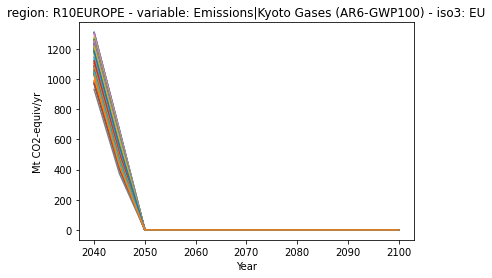

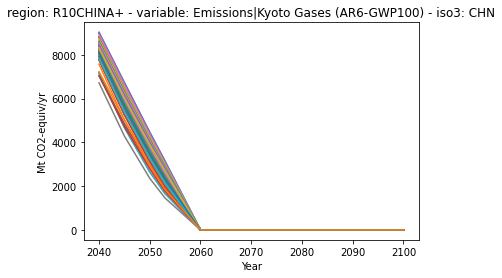

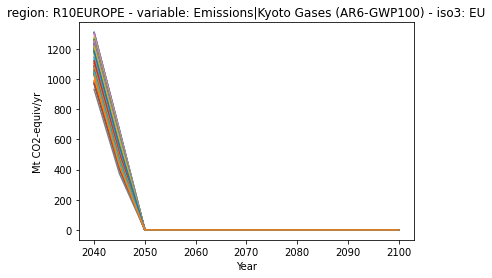

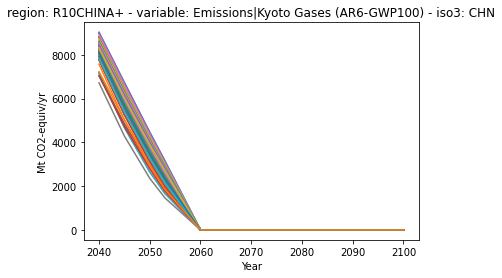

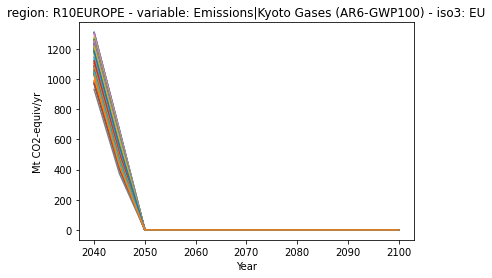

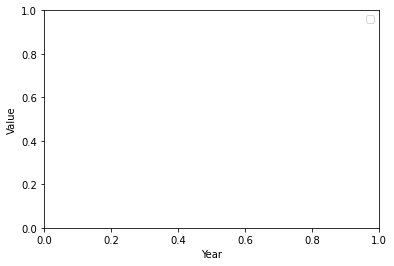

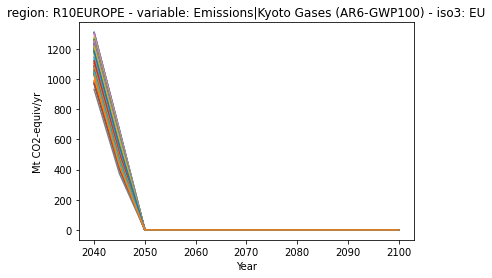

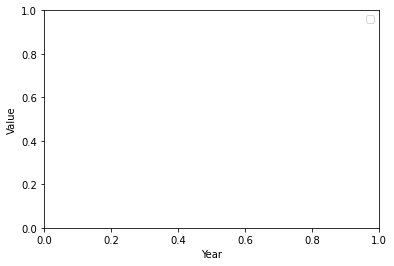

In [77]:
# We append the most recent relevant estimate of the fractional importance of the region using 
# the CAIT data
emissions_avoided_dict = {}
emissions_avoided_regions_dict = {}
country_emissions_dict = {}
country_emissions_dict_nonz = {}
major_columns = ["model", "scenario", "region", "variable", "unit", "year"]
for confidence_col in confidence_cols:
    for certainty in list_certainties:
        print(f"certainty: {certainty}, conf: {confidence_col}")
        for co2_or_kyoto in ["all_GHG", "CO2_only"]:
            nzcoms = nzcoms_copy.copy()
            nzcoms["fraction2030"] = np.nan
            if certainty == "stronger":
                nzcoms = nzcoms.loc[nzcoms[confidence_col] == "stronger", :]
            
            print(nzcoms["Country"].head())
            co2_or_kyoto_col = "Net zero target applicable to"
            for index, row in nzcoms.iterrows():
                frac0 = cait_data.loc[(cait_data["iso3"] == row["iso3"])]["region_fraction"]
                assert len(frac0) == 1
                frac0 = frac0.values[0]
                fraction2030 = frac0 * float(row[col2030]) / float(row[currentcol])
                # if the value applies to anything other than Kyoto total, find the fraction of the kyoto total 
                # that is CO2 in that region at that time. 
                if co2_or_kyoto == "CO2_only":
                    if row[co2_or_kyoto_col] in ["UNCLEAR", "CO2"]:
                        co2frac2030 = (nominated_scen.filter(variable=co2, region=row["region"]).data.value / 
                            nominated_scen_kyoto.filter(region=row["region"]).data.value).squeeze()
                        # print(f'Country {row["iso3"]} is CO2 only, reduced by {co2frac2030}')
                        fraction2030 = co2frac2030 * fraction2030
                elif co2_or_kyoto == "all_GHG":
                    if row[co2_or_kyoto_col] in ["CO2"]:
                        co2frac2030 = (nominated_scen.filter(variable=co2, region=row["region"]).data.value / 
                            nominated_scen_kyoto.filter(region=row["region"]).data.value).squeeze()
                        #print(f'Country {row["iso3"]} is CO2 only, reduced by {co2frac2030}')
                        fraction2030 = co2frac2030 * fraction2030
                else:
                    raise ValueError(f"Bad co2_or_kyoto: {co2_or_kyoto}")
                assert np.isfinite(fraction2030)
                    
                nzcoms.loc[index, "fraction2030"] = fraction2030

            # Now we can calculate the avoided emissions
            # Remove existing variable if any to allow reruns
            country_emissions_nonz = []
            try:
                del emissions_avoided
                del country_emissions
            except:
                pass
            for index, row in nzcoms.iterrows():
                em2030 = region_tot_kyoto.filter(year=2030, region=row["region"])
                emrecent = region_tot_kyoto.filter(year=int(currentcol), region=row["region"])
                assert em2030.data[["model", "scenario"]].equals(emrecent.data[["model", "scenario"]])
                frac2030 = row["fraction2030"] * (emrecent.data.value / em2030.data.value)
                # Years in between the nz commitment year and 2030 have the appropriate fraction 
                # reduced linearly towards zero.
                country_emissions_nonz_i = region_tot_kyoto.filter(region=row["region"]).timeseries()
                assert len(frac2030) == len(country_emissions_nonz_i)
                country_emissions_nonz_i *= frac2030
                country_emissions_nonz_i = country_emissions_nonz_i.reset_index()
                country_emissions_nonz_i["iso3"] = row["iso3"]
                country_emissions_nonz.append(country_emissions_nonz_i)
                for year in [
                    year for year in region_tot_kyoto.year if (year > 2030) & (year < int(row["Year.2"]))
                ]:
                    emissions_avoided_inst = region_tot_kyoto.filter(year=year, region=row["region"]).data
                    emissions_avoided_inst["iso3"] = row["iso3"]
                    # We only apply the reduction to emissions when the region is producing positive emissions!
                    country_emissions_inst = emissions_avoided_inst.copy() 
                    country_emissions_inst["value"] = country_emissions_inst["value"] * frac2030
                    emissions_avoided_inst["value"] = (emissions_avoided_inst["value"] * frac2030 - row["Total.2"])
                    country_emissions_inst["value"] = country_emissions_inst["value"] * (
                        country_emissions_inst["value"] > 0) * (1-((year - 2030) / (int(row["Year.2"]) - 2030)))
                    emissions_avoided_inst["value"] = emissions_avoided_inst["value"] * (
                        emissions_avoided_inst["value"] > 0) * ((year - 2030) / (int(row["Year.2"]) - 2030)
                    )
                    if any(country_emissions_inst["value"] < 0):
                        print(f"index {index} in year {year} is negative")
                    try:
                        emissions_avoided = emissions_avoided.append(emissions_avoided_inst)
                        country_emissions = country_emissions.append(country_emissions_inst)
                    except NameError:
                        emissions_avoided = emissions_avoided_inst.copy()
                        country_emissions = country_emissions_inst.copy()
                # Years after the nz year have the relevant fraction set to 0
                for year in [year for year in region_tot_kyoto.year if year >= int(row["Year.2"])]:
                    emissions_avoided_inst = region_tot_kyoto.filter(year=year, region=row["region"]).data
                    emissions_avoided_inst["iso3"] = row["iso3"]
                    country_emissions_inst = emissions_avoided_inst.copy()
                    country_emissions_inst["value"] = row["Total.2"]
                    emissions_avoided_inst["value"] = (emissions_avoided_inst["value"] * frac2030 - row["Total.2"])
                    emissions_avoided_inst["value"] = emissions_avoided_inst["value"] * (emissions_avoided_inst["value"] > 0)
                    emissions_avoided = emissions_avoided.append(emissions_avoided_inst)
                    country_emissions = country_emissions.append(country_emissions_inst)
            # Plot the emissions change for a few fiddly cases
            pyam.IamDataFrame(country_emissions[country_emissions["iso3"]=="EU"]).plot()
            pyam.IamDataFrame(country_emissions[country_emissions["iso3"]=="CHN"]).plot()
            emissions_avoided_regions_dict[(confidence_col, certainty, co2_or_kyoto)] = emissions_avoided.copy()
            emissions_avoided = emissions_avoided.groupby(major_columns).sum().reset_index()
            emissions_avoided_world = pyam.IamDataFrame(emissions_avoided).aggregate_region(kyoto)
            assert len(emissions_avoided_world.filter(year=2080).data) == len(
                all_extensions_orig.filter(variable=kyoto, year=2080))
            emissions_avoided_dict[(confidence_col, certainty, co2_or_kyoto)] = emissions_avoided_world
            country_emissions_dict[(confidence_col, certainty, co2_or_kyoto)] = country_emissions
            country_emissions_dict_nonz[(confidence_col, certainty, co2_or_kyoto)] = country_emissions_nonz

In [78]:
# Apply net zero avoidance to the original pathways
try:
    del nzpathways
except:
    pass
for confidence_col in confidence_cols:
    for certainty in list_certainties:
        for co2_or_kyoto in ["CO2_only", "all_GHG"]:
            nzpathways_i = all_extensions_orig.filter(variable=kyoto).data
            nzpathways_i = nzpathways_i.merge(
                emissions_avoided_dict[(confidence_col, certainty, co2_or_kyoto)].data, on=major_columns, how="left"
            )
            nzpathways_i.value_y[np.isnan(nzpathways_i.value_y)] = 0

            nzpathways_i["value"] = nzpathways_i["value_x"] - nzpathways_i["value_y"]
            nzpathways_i = nzpathways_i.drop(["value_x", "value_y"], axis=1)
            nzpathways_i["scenario"] = (
                nzpathways_i["scenario"] + "|nz_" + co2_or_kyoto + "|cert_" + certainty + "conf_" + str(confidence_col)
            )
            try:
                nzpathways = nzpathways.append(pyam.IamDataFrame(nzpathways_i))
            except NameError:
                nzpathways = pyam.IamDataFrame(nzpathways_i)

C:\Users\rlamboll\Anaconda3\envs\silicone-1\lib\site-packages\ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]


In [79]:
nzpathways.scenario

['Max|Harmonized|KyotoFromPrice_incrate2_MESSAGEix-GLOBIOM_1.1_EN_NPi|nz_CO2_only|cert_allconf_0.1',
 'Max|Harmonized|KyotoFromPrice_incrate2_MESSAGEix-GLOBIOM_1.1_EN_NPi|nz_CO2_only|cert_strongerconf_0.1',
 'Max|Harmonized|KyotoFromPrice_incrate2_MESSAGEix-GLOBIOM_1.1_EN_NPi|nz_all_GHG|cert_allconf_0.1',
 'Max|Harmonized|KyotoFromPrice_incrate2_MESSAGEix-GLOBIOM_1.1_EN_NPi|nz_all_GHG|cert_strongerconf_0.1',
 'Max|Harmonized|KyotoFromPrice_incrate2_REMIND-MAgPIE 2.1-4.2_EN_NPi|nz_CO2_only|cert_allconf_0.1',
 'Max|Harmonized|KyotoFromPrice_incrate2_REMIND-MAgPIE 2.1-4.2_EN_NPi|nz_CO2_only|cert_strongerconf_0.1',
 'Max|Harmonized|KyotoFromPrice_incrate2_REMIND-MAgPIE 2.1-4.2_EN_NPi|nz_all_GHG|cert_allconf_0.1',
 'Max|Harmonized|KyotoFromPrice_incrate2_REMIND-MAgPIE 2.1-4.2_EN_NPi|nz_all_GHG|cert_strongerconf_0.1',
 'Max|Harmonized|KyotoFromPrice_incrate3_MESSAGEix-GLOBIOM_1.1_EN_NPi|nz_CO2_only|cert_allconf_0.1',
 'Max|Harmonized|KyotoFromPrice_incrate3_MESSAGEix-GLOBIOM_1.1_EN_NPi|nz_CO

pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'model: Current policies - region: World - variable: Emissions|Kyoto Gases (AR6-GWP100)'}, xlabel='Year', ylabel='Mt CO2-equiv/yr'>

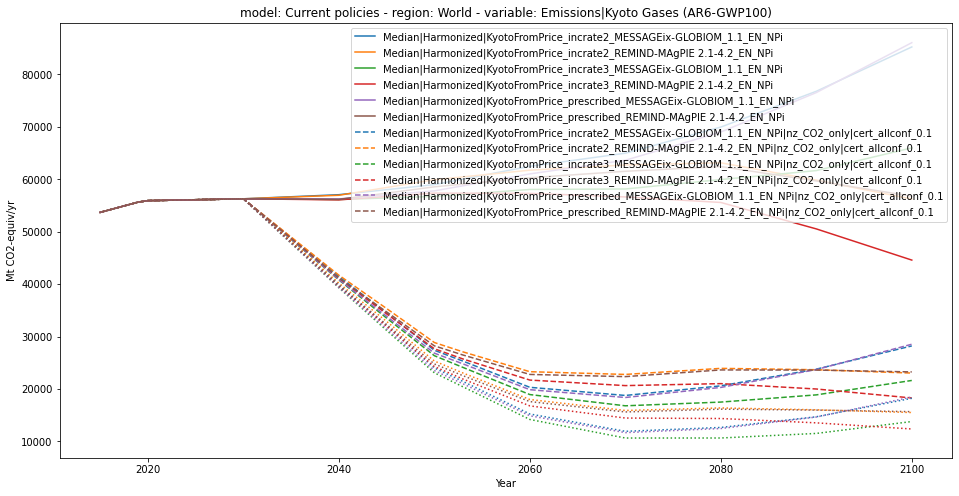

In [80]:
plt.figure(figsize=(16,8))
ax = plt.subplot(111)
all_extensions_orig.filter(model="Current policies", 
                           variable=kyoto, scenario="Median*Kyoto*").plot(ax=ax)
plt.gca().set_prop_cycle(None)
nzpathways.filter(model="Current policies", 
                  variable=kyoto, scenario="Median*Kyoto*CO2_only|cert_all*").plot(ax=ax, 
    linestyle="--")
plt.gca().set_prop_cycle(None)
nzpathways.filter(model="Current policies", 
                  variable=kyoto, scenario="Median*Kyoto*GHG*|cert_allconf*").plot(ax=ax,
    linestyle=":")

pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'model: NDC case - conditional - region: World - variable: Emissions|Kyoto Gases (AR6-GWP100)'}, xlabel='Year', ylabel='Mt CO2-equiv/yr'>

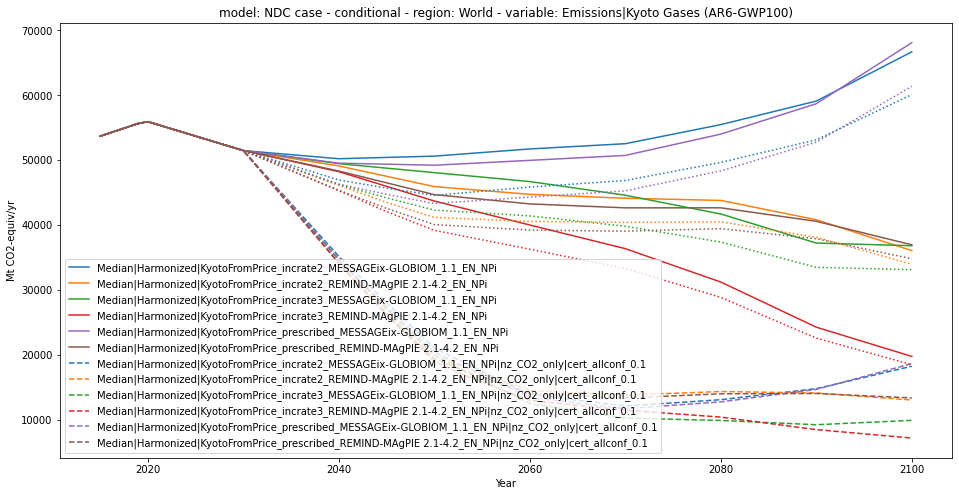

In [81]:
plt.figure(figsize=(16,8))
modelstr = "NDC case - conditional"
ax = plt.subplot(111)
all_extensions_orig.filter(model=modelstr, variable=kyoto, scenario="Median*Kyoto*").plot(ax=ax)
plt.gca().set_prop_cycle(None)
nzpathways.filter(model=modelstr, 
                  variable=kyoto, scenario="Median*Kyoto*CO2_only*cert_all*").plot(ax=ax, 
    linestyle="--")
plt.gca().set_prop_cycle(None)
nzpathways.filter(model=modelstr, 
                  variable=kyoto, scenario="Median*Kyoto*CO2_only*cert_strongerconf_0.1").plot(ax=ax, 
    linestyle=":")

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'model: NDC case - conditional - region: World - variable: Emissions|Kyoto Gases (AR6-GWP100)'}, xlabel='Year', ylabel='Mt CO2-equiv/yr'>

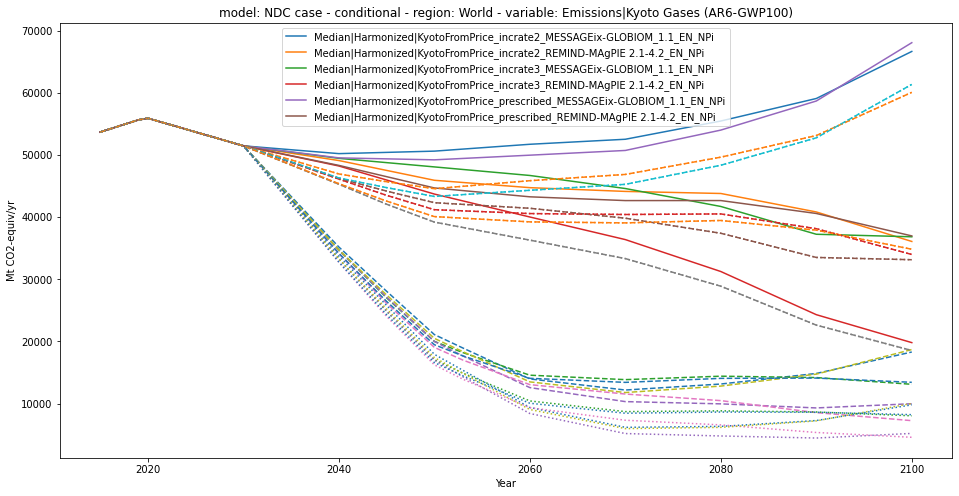

In [82]:
plt.figure(figsize=(16,8))
modelstr = "NDC case - conditional"
ax = plt.subplot(111)
all_extensions_orig.filter(model=modelstr, 
                           variable=kyoto, scenario="Median*Kyoto*").plot(ax=ax)
plt.gca().set_prop_cycle(None)
nzpathways.filter(model=modelstr, 
                  variable=kyoto, scenario="Median*Kyoto*CO2_only*").plot(ax=ax, 
    linestyle="--")
plt.gca().set_prop_cycle(None)
nzpathways.filter(model=modelstr, 
                  variable=kyoto, scenario="Median*Kyoto*GHG*").plot(ax=ax,
    linestyle=":")

pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'model: Current policies - region: R10EUROPE - variable: Emissions|Kyoto Gases (AR6-GWP100)'}, xlabel='Year', ylabel='Mt CO2-equiv/yr'>

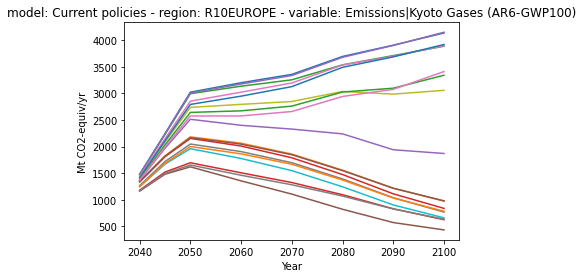

In [83]:
pyam.IamDataFrame(emissions_avoided).filter(region="R10EUROPE", scenario="*Kyoto*", model="Current*").plot()

# Finally break down the nz-corrected Kyoto baskets into their components
We use only the appropriate scenario in the harmonised SR1.5 dataset to do this again. 

In [84]:
years = [2015, 2019] + list(range(2010, 2101, 10)) + interpyears
if co2afolu not in set(non_co2_ind_compon):
    non_co2_ind_compon = non_co2_ind_compon + [co2afolu]
harmed_sr15 = harmed_sr15.interpolate(interpyears)
all_nz_extensions = nzpathways.copy()
fgas_em_inf = mi.DecomposeCollectionTimeDepRatio(harmed_sr15.filter(year=years, region="World").interpolate(interpyears))
for (model, scenario, shortname) in mod_scen_list:
    print ("Running model {}, scenario {}".format(model, scenario))
    extend_df = nzpathways.filter(scenario="*" + model + "*" + shortname + "*")
    infill_df = harmed_sr15.filter(model=model, scenario=scenario)
    # Perform the infilling using Kyoto total (no exclusions)
    infill_results = infill_components_of_partial_aggregate(
        variable, extend_df, infill_df, non_co2_ind_compon, co2, co2ind, co2afolu, 
        fgas_em_inf, years, fgas, fgases, hfcs
    )
    
    all_nz_extensions = all_nz_extensions.append(infill_results.filter(variable=variable, keep=False), ignore_meta_conflict=True)

Running model MESSAGEix-GLOBIOM_1.1, scenario ['EN_NPi2020_*00f', 'EN_NoPolicy']


c:\users\rlamboll\constraincode\silicone\src\silicone\multiple_infillers\infill_all_required_emissions_for_openscm.py:191: UserWarning: No data for ['Emissions|PFC|C2F6', 'Emissions|PFC|C6F14', 'Emissions|HFC|HFC245ca'], it will be infilled with 0s
  unavailable_variables
silicone.database_crunchers.constant_ratio - INFO: <class 'silicone.database_crunchers.constant_ratio.ConstantRatio'> won't use any information from the database
Filling required variables: 100%|████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 12.06it/s]


Note that the lead variable ['Emissions|Kyoto Gases (AR6-GWP100)'] goes negative.
Note that the lead variable ['Emissions|Kyoto Gases (AR6-GWP100)'] goes negative.


Filling required variables: 100%|██████████████████████████████████████████████████████| 20/20 [00:03<00:00,  5.36it/s]


Running model REMIND-MAgPIE 2.1-4.2, scenario ['EN_NPi2020_*00f', 'EN_NoPolicy']


c:\users\rlamboll\constraincode\silicone\src\silicone\multiple_infillers\infill_all_required_emissions_for_openscm.py:191: UserWarning: No data for ['Emissions|PFC|CF4', 'Emissions|PFC|C2F6', 'Emissions|PFC|C6F14', 'Emissions|HFC|HFC134a', 'Emissions|HFC|HFC143a', 'Emissions|HFC|HFC227ea', 'Emissions|HFC|HFC23', 'Emissions|HFC|HFC32', 'Emissions|HFC|HFC43-10', 'Emissions|HFC|HFC245ca', 'Emissions|HFC|HFC125'], it will be infilled with 0s
  unavailable_variables
silicone.database_crunchers.constant_ratio - INFO: <class 'silicone.database_crunchers.constant_ratio.ConstantRatio'> won't use any information from the database
Filling required variables: 100%|██████████████████████████████████████████████████████| 12/12 [00:02<00:00,  4.86it/s]


In [85]:
# Also apply net zero effects on a regional level by downscaling results
try:
    del nzpathwaysregional
except:
    pass

for (model, scenario, shortname) in mod_scen_list:
    # Manipulate the info on regions into the variable name in the all-regions database
    sr15_all_regswap_var = set(harmed_sr15_regions.filter(scenario=scenario, model=model).variable.copy()) - set([co2afolu])
    sr15_all_regswap = swap_region_into_var(harmed_sr15_regions.filter(scenario=scenario, model=model))
    regional_downscaler = mi.DecomposeCollectionTimeDepRatio(sr15_all_regswap)
    regional_remainder_downscaler = mi.SplitCollectionWithRemainderEmissions(sr15_all_regswap)

    # find the appropriate aspect of the database to be infilled and rename it
    region_to_infill = all_nz_extensions.filter(scenario="*" + model + "*" + shortname + "*", year=sr15_all_regswap.year)
    region_to_infill_variables = all_nz_extensions.variable
    region_to_infill = swap_region_into_var(region_to_infill)
    
    # Infill all times
    # CO2 AFOLU is infilled using remainders as we have a sign difference in the target database in 2030. Latin America
    # has the highest uncertainty and so is infilled last
    new_regional = regional_remainder_downscaler.infill_components(
        co2afolu + "_World", 
        [co2afolu + "_" + reg for reg in regions if reg != last_infill_region], 
        co2afolu + "_" + last_infill_region,
        region_to_infill,
        metric_name="AR6GWP100"
    )
    try:
        nzpathwaysregional = nzpathwaysregional.append(new_regional)
    except NameError:
        nzpathwaysregional = pyam.IamDataFrame(new_regional)
    for var in regional_emtype:
        if var in sr15_all_regswap_var:
            # This will produce an irritating number of warnings about negative values
            sys.stdout = open(os.devnull, 'w')
            new_regional = regional_downscaler.infill_components(
                var + "_World", [var + "_" + reg for reg in regions], 
                region_to_infill.filter(variable=var+"_*")
            )
            sys.stdout = stdout
            nzpathwaysregional = nzpathwaysregional.append(new_regional)
nzpathwaysregional = split_regions_off(nzpathwaysregional)

silicone.database_crunchers.time_dep_ratio - WARNING: Note that the lead variable ['Emissions|CO2|Energy and Industrial Processes_World'] goes negative. The time dependent ratio cruncher can produce unexpected results in this case.
silicone.database_crunchers.time_dep_ratio - WARNING: Note that the lead variable ['Emissions|CO2|Energy and Industrial Processes_World'] goes negative. The time dependent ratio cruncher can produce unexpected results in this case.
silicone.database_crunchers.time_dep_ratio - WARNING: Note that the lead variable ['Emissions|CO2|Energy and Industrial Processes_World'] goes negative. The time dependent ratio cruncher can produce unexpected results in this case.
silicone.database_crunchers.time_dep_ratio - WARNING: Note that the lead variable ['Emissions|CO2|Energy and Industrial Processes_World'] goes negative. The time dependent ratio cruncher can produce unexpected results in this case.
silicone.database_crunchers.time_dep_ratio - WARNING: Note that the lead

In [86]:
all_nz_inc_regions = nzpathwaysregional.append(all_nz_extensions.filter(year=years, keep=False))
assert all_nz_inc_regions.check_aggregate_region(co2ind) == None

pyam.core - WARNING: Filtered IamDataFrame is empty!


In [87]:
nzpathwaysregional.append(regions_added).to_csv(f"../output/regional_emissions_projections_{version_no}.csv")

In [88]:
all_nz_extensions = all_nz_extensions.data
for var in vars_to_convert:
    ind = [var in y for y in all_nz_extensions["variable"]]
    assert (all_nz_extensions.iloc[ind].value==0).all()
    index = all_nz_extensions[ind].index
    all_nz_extensions.loc[index, "unit"] = all_nz_extensions.loc[index, "unit"].str.replace("Mt CO2-equiv", "kt " + var)
all_nz_extensions = pyam.IamDataFrame(all_nz_extensions)

In [89]:
assert all_nz_extensions.filter(variable="*C6F14").unit == ["kt C6F14/yr"]
assert all_extensions_orig.filter(variable="*C6F14").unit == ["kt C6F14/yr"]

In [90]:
# Check that we don't miss out some important variables from this scenario
assert len(
    [var for var in all_extensions.variable if var not in 
 all_extensions.filter(scenario=all_extensions.scenario[0]).variable + 
     ['Emissions|F-Gases', 'Price|Carbon']
    ]
) == 0

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'region: World - variable: Emissions|SF6'}, xlabel='Year', ylabel='kt SF6/yr'>

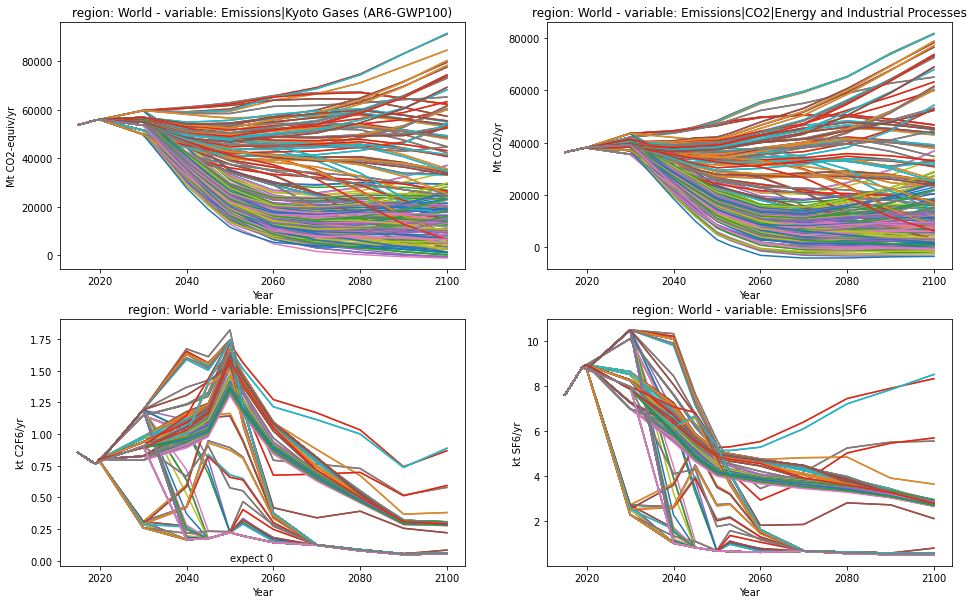

In [91]:
plt.figure(figsize=(16, 10))
ax = plt.subplot(2, 2, 1)
all_nz_extensions.filter(variable=kyoto).plot(ax=ax)
ax= plt.subplot(2, 2, 2)
all_nz_extensions.filter(variable=co2ind).plot(ax=ax)
ax= plt.subplot(2, 2, 3)
all_nz_extensions.filter(variable="Emissions|PFC|C2F6").plot(ax=ax)
plt.text(x=2050, y=0, s="expect 0")
ax= plt.subplot(2, 2, 4)
all_nz_extensions.filter(variable="*SF6").plot(ax=ax)

In [92]:
assert len(all_nz_extensions.filter(variable="Emissions|PFC|C2F6").timeseries())==len(
    all_nz_extensions.filter(variable=co2afolu).timeseries())

In [93]:
ts = all_nz_extensions.filter(variable=kyoto).timeseries()
ts.loc[ts[2050] == max(ts[2050]), :]

2015  \
model            scenario                                           region variable                           unit                            
Current policies Max|Harmonized|KyotoFromPrice_incrate2_REMIND-M... World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  53692.293621   
                 Max|Harmonized|KyotoFromPrice_incrate2_REMIND-M... World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  53692.293621   

                                                                                                                                     2019  \
model            scenario                                           region variable                           unit                          
Current policies Max|Harmonized|KyotoFromPrice_incrate2_REMIND-M... World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  55655.8363   
                 Max|Harmonized|KyotoFromPrice_incrate2_REMIND-M... World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  55655.8363   

                                                                                                                                       2020  \
model            scenario                                           region variable                           unit                            
Current policies Max|Harmonized|KyotoFromPrice_incrate2_REMIND-M... World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  55926.631256   
                 Max|Harmonized|KyotoFromPrice_incrate2_REMIND-M... World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  55926.631256   

                                                                                                                                       2030  \
model            scenario                                           region variable                           unit                            
Current policies Max|Harmonized|KyotoFromPrice_incrate2_REMIND-M... World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  59693.646439   
                 Max|Harmonized|KyotoFromPrice_incrate2_REMIND-M... World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  59693.646439   

                                                                                                                                       2040  \
model            scenario                                           region variable                           unit                            
Current policies Max|Harmonized|KyotoFromPrice_incrate2_REMIND-M... World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  61085.270001   
                 Max|Harmonized|KyotoFromPrice_incrate2_REMIND-M... World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  61085.270001   

                                                                                                                                      2045  \
model            scenario                                           region variable                           unit                           
Current policies Max|Harmonized|KyotoFromPrice_incrate2_REMIND-M... World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  61908.47337   
                 Max|Harmonized|KyotoFromPrice_incrate2_REMIND-M... World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  61908.47337   

                                                                                                                                       2050  \
model            scenario                                           region variable                           unit                            
Current policies Max|Harmonized|KyotoFromPrice_incrate2_REMIND-M... World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  62898.143304   
                 Max|Harmonized|KyotoFromPrice_incrate2_REMIND-M... World  Emissions|Kyoto Gases (AR6-GWP100) Mt CO2-equiv/yr  62898.143304   

                                                                                                                                       2

pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'region: World - variable: Emissions|SF6'}, xlabel='Year', ylabel='kt SF6/yr'>

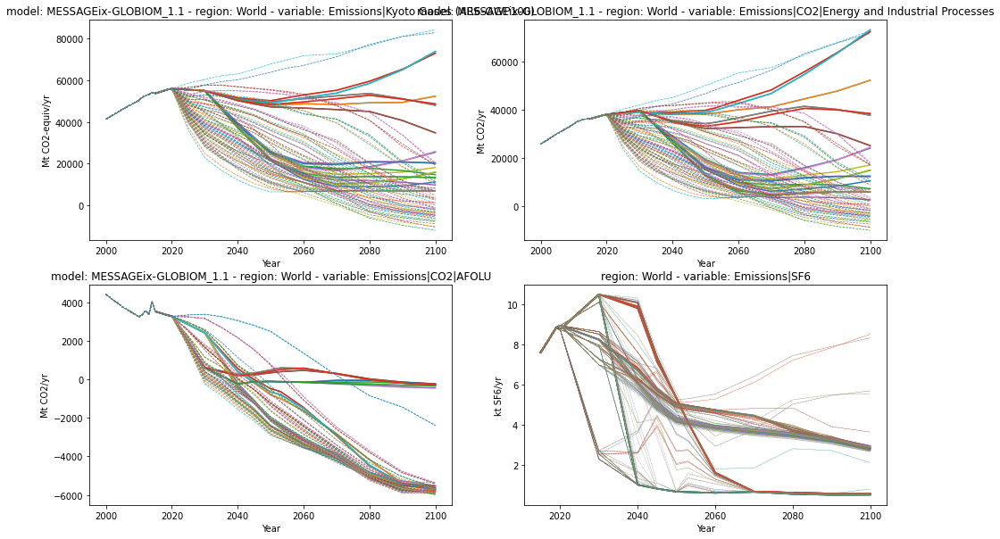

In [94]:
# Note that the SF6 data does not come from any specific scenario
plt.figure(figsize=(16, 10))
scen_str = "Median|Harmonized|KyotoFromPrice_*"
model_str = "NDC case - unconditional"
ax = plt.subplot(2, 2, 1)
all_nz_extensions.filter(variable=kyoto, scenario=scen_str, model=model_str).plot(ax=ax, linewidth=1.5, legend=False)
harmed_sr15.filter(variable=kyoto, model="*MESSAGE*", scenario=shortname+"*").plot(
    ax=ax, linewidth=0.7, linestyle="--", legend=False)
ax= plt.subplot(2, 2, 2)
all_nz_extensions.filter(variable=co2ind, scenario=scen_str, model=model_str).plot(ax=ax, linewidth=1.5, legend=False)
harmed_sr15.filter(variable=co2ind, model="*MESSAGE*", scenario=shortname+"*").plot(
    ax=ax, linewidth=0.7, linestyle="--", legend=False)
ax= plt.subplot(2, 2, 3)
all_nz_extensions.filter(variable=co2afolu, scenario=scen_str, model=model_str).plot(ax=ax, linewidth=1.5)
harmed_sr15.filter(variable=co2afolu, model="*MESSAGE*", scenario=shortname+"*").plot(
    ax=ax, linewidth=0.7, linestyle="--", legend=False)
ax= plt.subplot(2, 2, 4)
all_nz_extensions.filter(variable="*SF6", scenario=scen_str, model=model_str).plot(ax=ax, linewidth=1.7, legend=False)
all_nz_extensions.filter(variable="*SF6").plot(ax=ax, linewidth=0.3, linestyle="--", legend=False)

<AxesSubplot:title={'center':'region: World - variable: Emissions|SF6'}, xlabel='Year', ylabel='kt SF6/yr'>

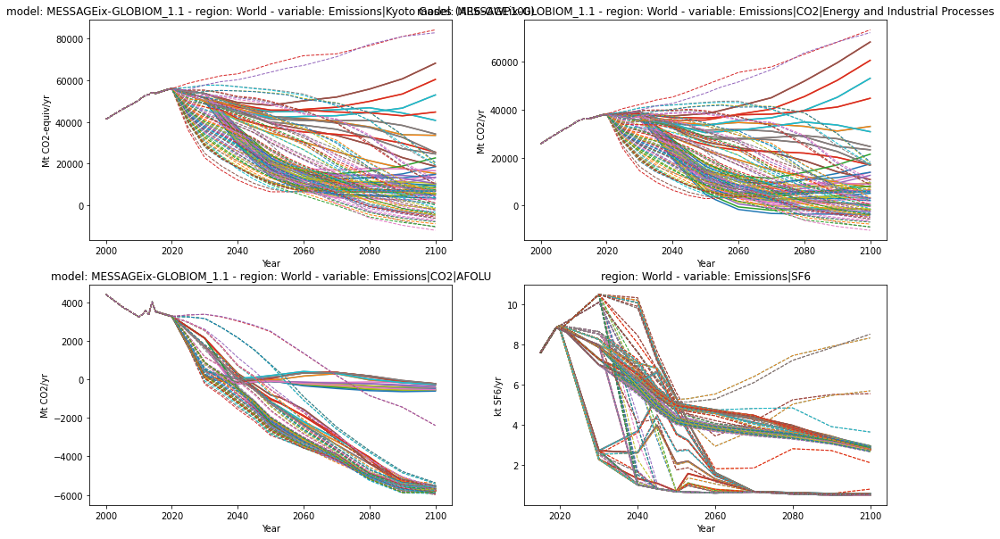

In [95]:
# Note that the SF6 data does not come from any specific scenario
plt.figure(figsize=(16, 10))
ax = plt.subplot(2, 2, 1)
scen_str = "Min|Harmonized|KyotoFromPrice_incr*"
all_nz_extensions.filter(variable=kyoto, scenario=scen_str).plot(ax=ax, linewidth=1.5, legend=False)
harmed_sr15.filter(variable=kyoto, model="*MESSAGE*", scenario=shortname+"*").plot(
    ax=ax, linewidth=1, linestyle="--", legend=False)
ax= plt.subplot(2, 2, 2)
all_nz_extensions.filter(variable=co2ind, scenario=scen_str).plot(ax=ax, linewidth=1.5, legend=False)
harmed_sr15.filter(variable=co2ind, model="*MESSAGE*", scenario=shortname+"*").plot(
    ax=ax, linewidth=1, linestyle="--", legend=False)
ax= plt.subplot(2, 2, 3)
all_nz_extensions.filter(variable=co2afolu, scenario=scen_str).plot(ax=ax, linewidth=1.5, legend=False)
harmed_sr15.filter(variable=co2afolu, model="*MESSAGE*", scenario=shortname+"*").plot(
    ax=ax, linewidth=1, linestyle="--", legend=False)
ax= plt.subplot(2, 2, 4)
all_nz_extensions.filter(variable="*SF6", scenario=scen_str).plot(ax=ax, linewidth=1.7, legend=False)
all_nz_extensions.filter(variable="*SF6").plot(ax=ax, linewidth=1, linestyle="--", legend=False)

<AxesSubplot:title={'center':'region: World - variable: Emissions|BC'}, xlabel='Year', ylabel='Mt BC/yr'>

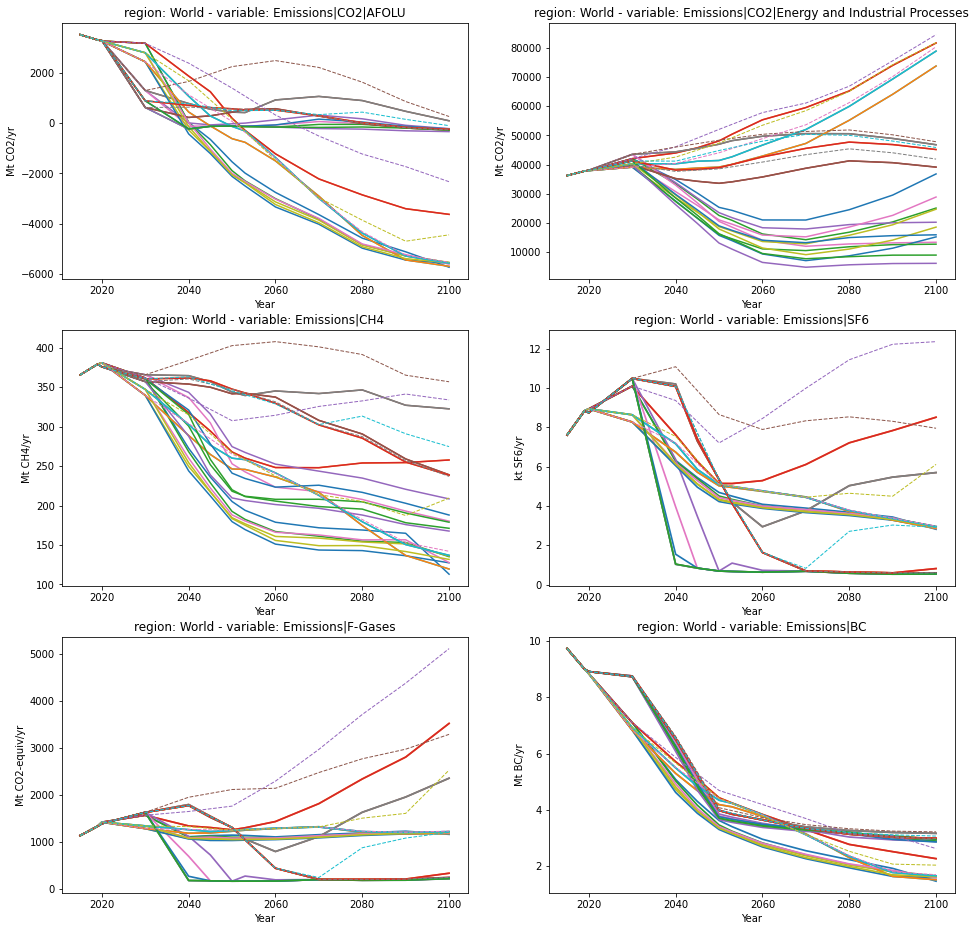

In [96]:
plt.figure(figsize=(16, 16))
ax = plt.subplot(3, 2, 1)
scen_str = "Max|Harmonized|KyotoFromPrice_prescribed*"
all_nz_extensions.filter(variable=co2afolu, scenario=scen_str).plot(ax=ax, linewidth=1.5, legend=False)
all_extensions.filter(variable=co2afolu, scenario=scen_str).plot(
    ax=ax, linewidth=1, linestyle="--", legend=False)
ax= plt.subplot(3, 2, 2)
all_nz_extensions.filter(variable=co2ind, scenario=scen_str).plot(ax=ax, linewidth=1.5, legend=False)
all_extensions.filter(variable=co2ind, scenario=scen_str).plot(
    ax=ax, linewidth=1, linestyle="--", legend=False)
ax= plt.subplot(3, 2, 3)
all_nz_extensions.filter(variable="*CH4", scenario=scen_str).plot(ax=ax, linewidth=1.5, legend=False)
all_extensions.filter(variable="*CH4", scenario=scen_str).plot(
    ax=ax, linewidth=1, linestyle="--", legend=False)
ax= plt.subplot(3, 2, 4)
all_nz_extensions.filter(variable="*SF6", scenario=scen_str).plot(ax=ax, linewidth=1.7, legend=False)
all_extensions.filter(variable="*SF6", scenario=scen_str).plot(ax=ax, linewidth=1, linestyle="--", legend=False)
ax= plt.subplot(3, 2, 5)
all_nz_extensions.filter(variable="*F-Gases", scenario=scen_str).plot(ax=ax, linewidth=1.7, legend=False)
all_extensions.filter(variable="*F-Gases", scenario=scen_str).plot(ax=ax, linewidth=1, linestyle="--", legend=False)
ax= plt.subplot(3, 2, 6)
all_nz_extensions.filter(variable="*BC", scenario=scen_str).plot(ax=ax, linewidth=1.7, legend=False)
all_extensions.filter(variable="*BC", scenario=scen_str).plot(ax=ax, linewidth=1, linestyle="--", legend=False)

<AxesSubplot:title={'center':'region: World - variable: Emissions|BC'}, xlabel='Year', ylabel='Mt BC/yr'>

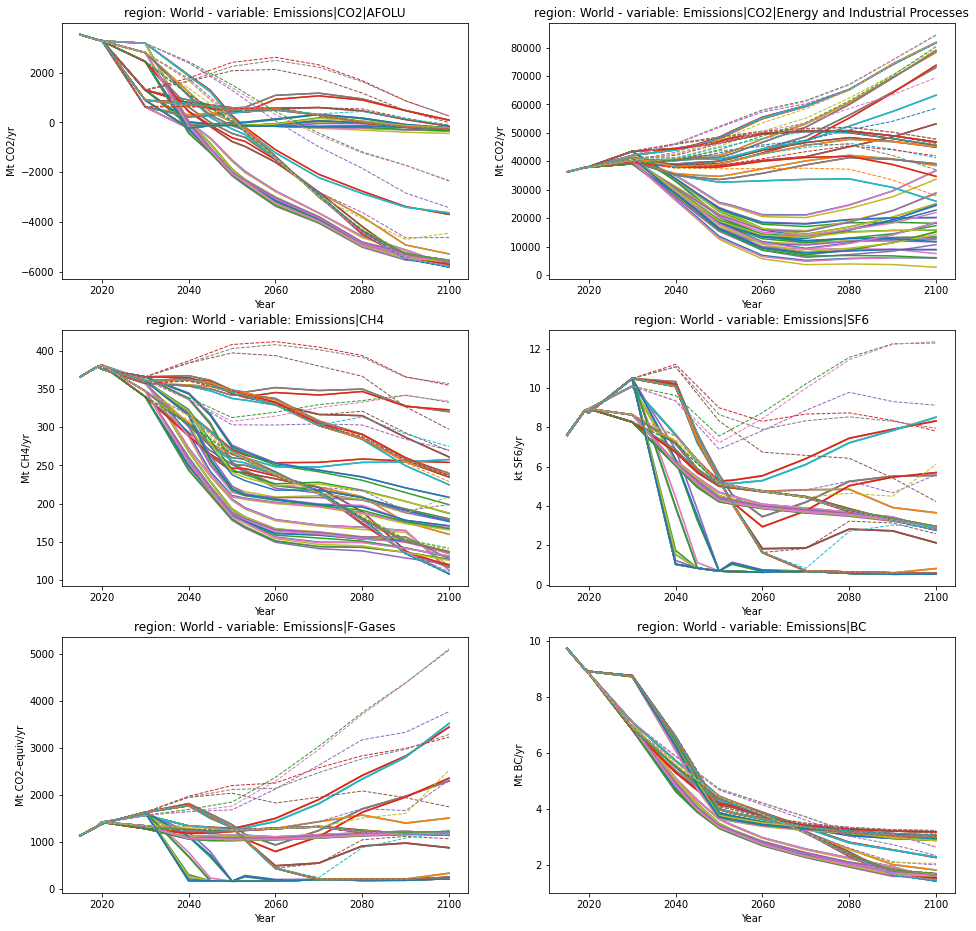

In [97]:
plt.figure(figsize=(16, 16))
ax = plt.subplot(3, 2, 1)
scen_str = "Max|Harmonized|KyotoFromPrice*"
all_nz_extensions.filter(variable=co2afolu, scenario=scen_str).plot(ax=ax, linewidth=1.5, legend=False)
all_extensions.filter(variable=co2afolu, scenario=scen_str).plot(
    ax=ax, linewidth=1, linestyle="--", legend=False)
ax= plt.subplot(3, 2, 2)
all_nz_extensions.filter(variable=co2ind, scenario=scen_str).plot(ax=ax, linewidth=1.5, legend=False)
all_extensions.filter(variable=co2ind, scenario=scen_str).plot(
    ax=ax, linewidth=1, linestyle="--", legend=False)
ax= plt.subplot(3, 2, 3)
all_nz_extensions.filter(variable="*CH4", scenario=scen_str).plot(ax=ax, linewidth=1.5, legend=False)
all_extensions.filter(variable="*CH4", scenario=scen_str).plot(
    ax=ax, linewidth=1, linestyle="--", legend=False)
ax= plt.subplot(3, 2, 4)
all_nz_extensions.filter(variable="*SF6", scenario=scen_str).plot(ax=ax, linewidth=1.7, legend=False)
all_extensions.filter(variable="*SF6", scenario=scen_str).plot(ax=ax, linewidth=1, linestyle="--", legend=False)
ax= plt.subplot(3, 2, 5)
all_nz_extensions.filter(variable="*F-Gases", scenario=scen_str).plot(ax=ax, linewidth=1.7, legend=False)
all_extensions.filter(variable="*F-Gases", scenario=scen_str).plot(ax=ax, linewidth=1, linestyle="--", legend=False)
ax= plt.subplot(3, 2, 6)
all_nz_extensions.filter(variable="*BC", scenario=scen_str).plot(ax=ax, linewidth=1.7, legend=False)
all_extensions.filter(variable="*BC", scenario=scen_str).plot(ax=ax, linewidth=1, linestyle="--", legend=False)

In [98]:
all_scenarios = all_extensions.append(all_nz_extensions)
all_scenarios = all_scenarios.interpolate(all_scenarios.year)
all_scenarios.to_csv("../output/infilled_extended_and_infilled_unep_{}.csv".format(version_no))

In [99]:
other_kyoto = all_scenarios.filter(variable=[variable, co2, co2afolu, co2ind]).append(
    _construct_consistent_values(
    "Emissions|Kyoto Gases (AR5-GWP100)", kyoto_emissions, convert_units_to_MtCO2_equiv(
        all_scenarios.filter(variable=kyoto_emissions), metric_name="AR5GWP100"
    )
)).append(
    _construct_consistent_values(
    "Emissions|Kyoto Gases (AR4-GWP100)", kyoto_emissions, convert_units_to_MtCO2_equiv(
        all_scenarios.filter(variable=kyoto_emissions), metric_name="AR4GWP100"
    )
)
)
other_kyoto.variable

['Emissions|CO2',
 'Emissions|CO2|AFOLU',
 'Emissions|CO2|Energy and Industrial Processes',
 'Emissions|Kyoto Gases (AR4-GWP100)',
 'Emissions|Kyoto Gases (AR5-GWP100)',
 'Emissions|Kyoto Gases (AR6-GWP100)']

In [100]:
assert len(other_kyoto.filter(variable=co2).scenario) == len(other_kyoto.filter(variable=variable).scenario)
assert len(other_kyoto.filter(variable=co2).scenario) == len(other_kyoto.filter(variable="Emissions|Kyoto Gases (AR5-GWP100)").scenario)

pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'region: World - variable: Emissions|Kyoto Gases (AR6-GWP100)'}, xlabel='Year', ylabel='Mt CO2-equiv/yr'>

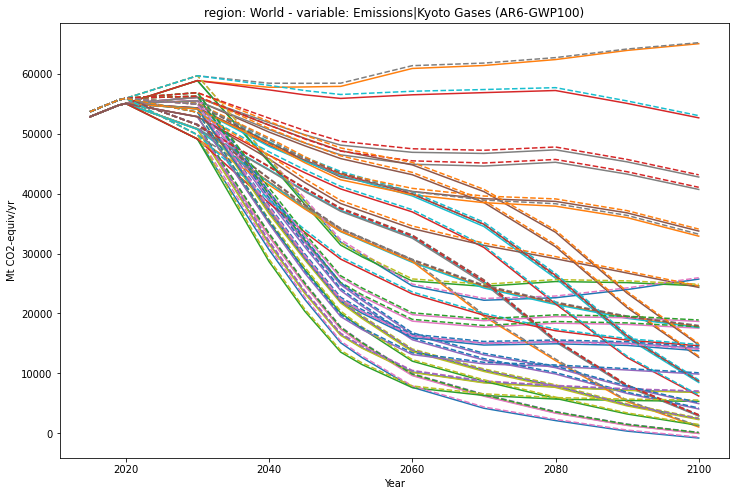

In [101]:
plt.figure(figsize=(12, 8))
ax=plt.subplot()
other_kyoto.filter(variable="*AR4-GWP100*", scenario="*extended|nz_CO2_only|*").plot(ax=ax)
other_kyoto.filter(variable="*AR6-GWP100*", scenario="*extended|nz_CO2_only|*").plot(ax=ax, linestyle="--")

In [102]:
other_kyoto.to_csv("../output/kyoto_and_co2_emissions_summary_{}.csv".format(version_no))

# Export .scen files

In [103]:
def construct_scen_file(infilled_data, scen_file_name):
    """Function to construct scen file"""
    def rename_variables(v):
        """Format variables to MAGICC variable convention"""
        mapping = {
        'Emissions|HFC|HFC143a':'Emissions|HFC143a',
        'Emissions|HFC|HFC245ca':"Emissions|HFC245fa",
        'Emissions|CO2|AFOLU':'Emissions|CO2|MAGICC AFOLU',
        'Emissions|HFC|HFC43-10': 'Emissions|HFC4310',
        'Emissions|HFC|HFC32':'Emissions|HFC32',
        'Emissions|HFC|HFC125':'Emissions|HFC125',
        'Emissions|HFC|HFC227ea':'Emissions|HFC227ea',
        'Emissions|CO2|Energy and Industrial Processes': 'Emissions|CO2|MAGICC Fossil and Industrial',
        'Emissions|HFC|HFC134a':'Emissions|HFC134a',
        'Emissions|HFC|HFC23':'Emissions|HFC23',
        'Emissions|PFC|CF4': 'Emissions|CF4',
        'Emissions|PFC|C2F6': 'Emissions|C2F6',
        'Emissions|PFC|C6F14': 'Emissions|C6F14',
        'Emissions|Sulfur': 'Emissions|SOx',
        'Emissions|VOC':'Emissions|NMVOC'
        }
    
        try:
            return mapping[v]
        except KeyError:
            return v

    def replace_units(u):
        """Replace units for NOx"""
            
        mapping = {
            'Mt NOX/yr': 'Mt NO2 / yr',
        }
        try:
            return mapping[u]
        except KeyError:
            return u

    # Filter out HFC and non HFC - unit conversions
    non_hfc = infilled_data.filter(variable=["Emissions|HFC*", "Emissions|PFC*"], keep=False)
    hfc = infilled_data.filter(variable=["Emissions|HFC*", "Emissions|PFC*"]).data
    
    # Work around for HFC345ca
    hfc["unit"] = hfc["variable"].apply(
        lambda x: 
        "kt {} / yr".format(
            x
            .split("|")[-1]
            .replace("-", "")
            .replace("245ca", "245fa")
        )
    )
    hfc = pyam.IamDataFrame(hfc)
    enCO2 = non_hfc.filter(variable="Emissions|CO2|Energy and Industrial Processes").data
    enCO2["unit"] = "Mt CO2/yr"
    enCO2 = pyam.IamDataFrame(enCO2)
    non_hfc = non_hfc.filter(
        variable = "Emissions|CO2|Energy and Industrial Processes",
        keep = False
    ).append(enCO2)
    non_hfc = non_hfc.convert_unit("Mt NH3/yr", to="Mt N/yr", factor=14/17)

    # Create an SCM dataframe 
    scen_scm = scmdata.ScmRun(hfc.append(non_hfc))
    writer = pymagicc.io.MAGICCData(scen_scm)
    vars_not_used = [
        "Emissions|CO2", 
        "Emissions|F-Gases",
        'Emissions|kyotoghg_excl_lulucf'    
    ]
    writer = writer.filter(variable=vars_not_used, keep=False)
    # Check whether all the variables are named appropriately
    expected_names = [
        pymagicc.definitions.convert_magicc7_to_openscm_variables(f"{v}_EMIS") 
        for v in pymagicc.definitions.PART_OF_SCENFILE_WITH_EMISSIONS_CODE_1
    ]

    writer["variable"] = writer["variable"].apply(rename_variables)
    writer["unit"] = writer["unit"].apply(replace_units)
    writer["todo"] = "SET"
        
    missing_names = set(expected_names) - set(writer["variable"].unique())
    assert not missing_names, missing_names
    problematic_names = set(writer["variable"].unique()) - set(expected_names)
    assert not problematic_names, problematic_names

    # Unit conversion and cleaning 
    unit_specs = pymagicc.definitions.MAGICC7_EMISSIONS_UNITS.set_index("magicc_variable")
    for v in writer["variable"]:
            magicc_var = pymagicc.definitions.convert_magicc7_to_openscm_variables(
                v, inverse=True).replace("T_EMIS", "").replace("_EMIS", "")
            magicc_unit = unit_specs.loc[magicc_var, "emissions_unit"]
            writer = writer.convert_unit(magicc_unit, variable=v)
    
    # Now we add the 2000 data from the SR1.5 SCEN files to ensure MAGICC doesn't
    # assume constant emissions between 2000 and the start of the SCEN file
    base_scen_file = os.path.join(
        os.path.dirname(os.path.abspath("__file__")),
        "..",
        "Input",
        "IPCCSR15_REMIND-MAgPIE 1.7-3.0_PEP_2C_red_netzero_GAS.SCEN",
    )
    extra_hist = pymagicc.io.MAGICCData(base_scen_file).filter(
        year = range(1, writer["year"].min()),
        region = "World"
    )

    # Overwrite model, scenario names
    extra_hist["scenario"] = writer.get_unique_meta("scenario",True)
    extra_hist["model"] = writer.get_unique_meta("model", True)
    extra_hist["unit"] = extra_hist["unit"].apply(
        lambda x: (
            x
            .replace("134a", "134A")
            .replace("143a", "143A")
            .replace("245fa", "245FA")
            .replace("227ea", "227EA")
        )
    )

    writer = pymagicc.io.MAGICCData(pd.concat(
        [
            extra_hist.timeseries(time_axis="year", meta=writer.timeseries().index.names),
            writer.timeseries(time_axis="year"),
        ],
        axis=1,
    ))
    # Write the scen file
    writer.write("{}.SCEN".format(scen_file_name), magicc_version=6)

In [104]:
scen_folder = f"../output/scens/v{version_no}/"
if not os.path.exists(scen_folder):
    os.makedirs(scen_folder)
scen_file = (scen_folder + "{}")

In [105]:
all_scenarios_renamed = all_scenarios.copy().data
all_scenarios_renamed["scenario"] = all_scenarios_renamed["scenario"].str.replace("|", "_")
all_scenarios_renamed = pyam.IamDataFrame(all_scenarios_renamed)

C:\Users\rlamboll\Anaconda3\envs\silicone-1\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  


In [106]:
len(all_scenarios_renamed.data.loc[:, ["model", "scenario"]].drop_duplicates())

360

In [112]:
primary_cases = [
    ('Current policies', 'Median_Harmonized_KyotoFromPrice_incrate2_MESSAGEix-GLOBIOM_1.1_EN_NPi'),
    ('Current policies', 'Median_Harmonized_KyotoFromPrice_incrate2_REMIND-MAgPIE 2.1-4.2_EN_NPi'),
    ('Current policies', 'Median_Harmonized_KyotoFromPrice_incrate3_MESSAGEix-GLOBIOM_1.1_EN_NPi_nz_CO2_only_cert_strongerconf_0.1'),
    ('Current policies', 'Median_Harmonized_KyotoFromPrice_incrate3_REMIND-MAgPIE 2.1-4.2_EN_NPi_nz_CO2_only_cert_strongerconf_0.1'),
    ('Current policies', 'Median_Harmonized_KyotoFromPrice_incrate3_REMIND-MAgPIE 2.1-4.2_EN_NPi_nz_all_GHG_cert_allconf_0.1'),
    ('Current policies', 'Median_Harmonized_KyotoFromPrice_incrate3_REMIND-MAgPIE 2.1-4.2_EN_NPi_nz_CO2_only_cert_allconf_0.1'),
    ('Current policies', 'Median_Harmonized_KyotoFromPrice_incrate3_MESSAGEix-GLOBIOM_1.1_EN_NPi_nz_all_GHG_cert_allconf_0.1'),
    ('Current policies', 'Median_Harmonized_KyotoFromPrice_incrate3_MESSAGEix-GLOBIOM_1.1_EN_NPi_nz_CO2_only_cert_allconf_0.1'),
    ('NDC case - conditional', 'Median_Harmonized_KyotoFromPrice_incrate3_REMIND-MAgPIE 2.1-4.2_EN_NPi_nz_all_GHG_cert_allconf_0.1'),
    ('NDC case - conditional', 'Median_Harmonized_KyotoFromPrice_incrate3_REMIND-MAgPIE 2.1-4.2_EN_NPi_nz_CO2_only_cert_allconf_0.1'),
    ('NDC case - conditional', 'Median_Harmonized_KyotoFromPrice_incrate3_MESSAGEix-GLOBIOM_1.1_EN_NPi_nz_all_GHG_cert_allconf_0.1'),
    ('NDC case - conditional', 'Median_Harmonized_KyotoFromPrice_incrate3_MESSAGEix-GLOBIOM_1.1_EN_NPi_nz_CO2_only_cert_allconf_0.1'),
]

In [113]:
primary_cases_2 = [(x[0], x[1].replace("Median", "Max")) for x in primary_cases]
primary_cases_3 = [(x[0], x[1].replace("Median", "Min")) for x in primary_cases]
primary_cases = primary_cases + primary_cases_2 + primary_cases_3

In [115]:
#for ind, (model, scenario) in all_scenarios_renamed.data.loc[:, ["model", "scenario"]].drop_duplicates().iterrows():
for (model, scenario) in primary_cases:
    construct_scen_file(all_scenarios_renamed.filter(scenario=scenario, model=model).filter(
        variable=['Emissions|Kyoto Gases (AR6-GWP100)', 
           'Emissions|HFC', 
           'Emissions|Kyoto Gases (AR6-GWP100)|Excluding CO2 AFOLU', 
           'Emissions|PFC', "Price|Carbon"
          ], keep=False), scen_file.format(
        model.replace(".", "-").replace(" ", "_") + "_-_" + scenario.replace(".", "-").replace(" ", "_").replace("/", "_").replace("*", "_")
        ))

Text(0, 0.5, 'Year')

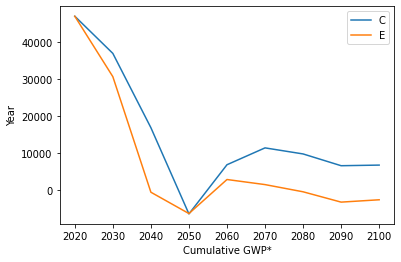

In [117]:
plt.figure()
ax = plt.subplot()
for mod, scen in [
    ('Current policies', 'Median_Harmonized_KyotoFromPrice_incrate3_REMIND-MAgPIE 2.1-4.2_EN_NPi_nz_CO2_only_cert_allconf_0.1'),
    ('NDC case - conditional', 'Median_Harmonized_KyotoFromPrice_incrate3_REMIND-MAgPIE 2.1-4.2_EN_NPi_nz_CO2_only_cert_allconf_0.1'),
]:
    investigate = all_scenarios_renamed.filter(
        year=[2015] + list(range(2010, 2101, 10)), 
        model=mod, 
        scenario=scen,
        variable=["*CH4", "*CO2"]
    )
    methane_deriv = investigate.filter(variable="*CH4").timeseries()
    gwp = 28*100*(methane_deriv.iloc[:, 1:].values - methane_deriv.iloc[:, 0:-1].values) / (
        methane_deriv.columns[1:] - methane_deriv.columns[:-1]).values
    methane_deriv.iloc[:, 1:] = gwp
    methane_deriv.iloc[:, 0] = np.nan
    gwps = pd.concat([methane_deriv, investigate.filter(variable=co2).timeseries()]).groupby("model").sum()
    gwps = gwps.iloc[:, 1:]
    plt.plot(gwps.columns, gwps.iloc[0])
plt.legend(["C", "E"])
plt.xlabel("Cumulative GWP*")
plt.ylabel("Year")

In [160]:
all_scenarios_renamed.filter(model='NDC case - conditional', scenario= 'Min_Harmonized_KyotoFromPrice_incrate3_REMIND-MAgPIE 2.1-4.2_EN_NPi_nz_CO2_only_cert_allconf_0.1', variable=co2ind).timeseries()

,,,,,2015,2019,2020,2030,2040,2045,2050,2053,2060,2070,2080,2090,2100
model,scenario,region,variable,unit,,,,,,,,,,,,,
NDC case - conditional,Min_Harmonized_KyotoFromPrice_incrate3_REMIND-MAgPIE 2.1-4.2_EN_NPi_nz_CO2_only_cert_allconf_0.1,World,Emissions|CO2|Energy and Industrial Processes,Mt CO2/yr,36244.214946,37771.449932,38067.268276,36963.997574,20597.154874,13613.447269,7306.838234,5251.601186,1531.156891,-62.975072,-678.898579,-1023.266729,-1423.339208


pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'model: REMIND-MAgPIE 2.1-4.2 - region: R10AFRICA - variable: Emissions|CO2'}, xlabel='Year', ylabel='Mt CO2/yr'>

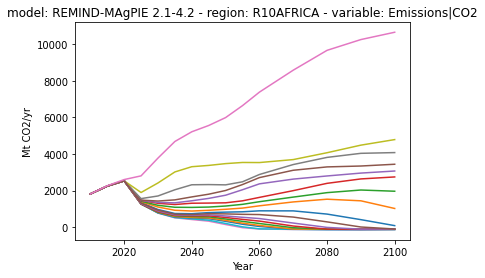

In [128]:
harmed_sr15_regions.filter(scenario=mod_scen_list[1][1], model=mod_scen_list[1][0], region="R10AFRICA", variable="*CO2").plot()

pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'model: REMIND-MAgPIE 2.1-4.2 - region: World - variable: Emissions|CO2'}, xlabel='Year', ylabel='Mt CO2/yr'>

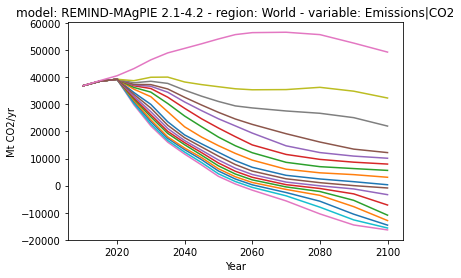

In [129]:
harmed_sr15_regions.filter(scenario=mod_scen_list[1][1], model=mod_scen_list[1][0], region="World", variable="*CO2").plot()

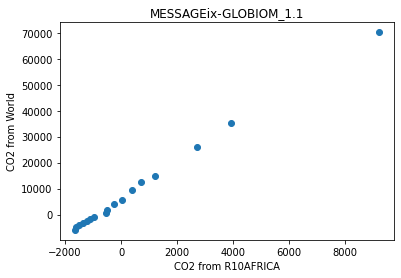

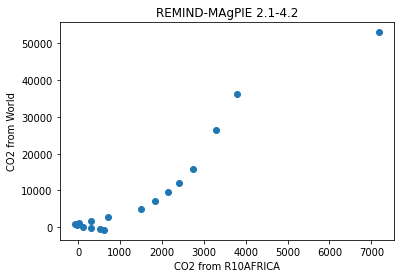

In [164]:
for i in [0, 1]:
    plt.figure()
    toplot = harmed_sr15_regions.append(harmed_sr15.filter(region="World", variable=co2ind)).filter(
        scenario=mod_scen_list[i][1], model=mod_scen_list[i][0], 
        region=["World", "R10AFRICA"], variable=co2ind
    ).timeseries().reset_index(["region", "scenario"]).reset_index(drop=True).pivot_table(
        index="scenario", columns="region", values=2080
    )
    plt.scatter(toplot["R10AFRICA"], toplot["World"])
    plt.xlabel("CO2 from R10AFRICA")
    plt.ylabel("CO2 from World")
    plt.title(mod_scen_list[i][0])

In [165]:
harmed_sr15_regions.append(harmed_sr15.filter(region="World", variable=co2ind)).filter(
        scenario=mod_scen_list[i][1], model=mod_scen_list[i][0], 
        region=["World", "R10AFRICA"], variable=co2ind
    ).timeseries()

2010  \
model                 scenario         region    variable                                      unit                      
REMIND-MAgPIE 2.1-4.2 EN_NPi2020_1000f R10AFRICA Emissions|CO2|Energy and Industrial Processes Mt CO2/yr   1207.160729   
                                       World     Emissions|CO2|Energy and Industrial Processes Mt CO2/yr  34048.619423   
                      EN_NPi2020_1200f R10AFRICA Emissions|CO2|Energy and Industrial Processes Mt CO2/yr   1207.160729   
                                       World     Emissions|CO2|Energy and Industrial Processes Mt CO2/yr  34048.619423   
                      EN_NPi2020_1400f R10AFRICA Emissions|CO2|Energy and Industrial Processes Mt CO2/yr   1207.160729   
                                       World     Emissions|CO2|Energy and Industrial Processes Mt CO2/yr  34048.619423   
                      EN_NPi2020_1600f R10AFRICA Emissions|CO2|Energy and Industrial Processes Mt CO2/yr   1207.160729   
                                       World     Emissions|CO2|Energy and Industrial Processes Mt CO2/yr  34048.619423   
                      EN_NPi2020_1800f R10AFRICA Emissions|CO2|Energy and Industrial Processes Mt CO2/yr   1207.160729   
                                       World     Emissions|CO2|Energy and Industrial Processes Mt CO2/yr  34048.619423   
                      EN_NPi2020_2000f R10AFRICA Emissions|CO2|Energy and Industrial Processes Mt CO2/yr   1207.160729   
                                       World     Emissions|CO2|Energy and Industrial Processes Mt CO2/yr  34048.619423   
                      EN_NPi2020_200f  R10AFRICA Emissions|CO2|Energy and Industrial Processes Mt CO2/yr   1207.160729   
                                       World     Emissions|CO2|Energy and Industrial Processes Mt CO2/yr  34048.619423   
                      EN_NPi2020_2500f R10AFRICA Emissions|CO2|Energy and Industrial Processes Mt CO2/yr   1207.160729   
                                       World     Emissions|CO2|Energy and Industrial Processes Mt CO2/yr  34048.619423   
                      EN_NPi2020_3000f R10AFRICA Emissions|CO2|Energy and Industrial Processes Mt CO2/yr   1207.160729   
                                       World     Emissions|CO2|Energy and Industrial Processes Mt CO2/yr  34048.619423   
                      EN_NPi2020_300f  R10AFRICA Emissions|CO2|Energy and Industrial Processes Mt CO2/yr   1207.160729   
                                       World     Emissions|CO2|Energy and Industrial Processes Mt CO2/yr  34048.619423   
                      EN_NPi2020_400f  R10AFRICA Emissions|CO2|Energy and Industrial Processes Mt CO2/yr   1207.160729   
                                       World     Emissions|CO2|Energy and Industrial Processes Mt CO2/yr  34048.619423   
                      EN_NPi2020_500f  R10AFRICA Emissions|CO2|Energy and Industrial Processes Mt CO2/yr   1207.160729   
                                       World     Emissions|CO2|Energy and Industrial Processes Mt CO2/yr  34048.619423   
                      EN_NPi2020_600f  R10AFRICA Emissions|CO2|Energy and Industrial Processes Mt CO2/yr   1207.160729   
                                       World     Emissions|CO2|Energy and Industrial Processes Mt CO2/yr  34048.619423   
                      EN_NPi2020_700f  R10AFRICA Emissions|CO2|Energy and Industrial Processes Mt CO2/yr   1207.160729   
                                       World     Emissions|CO2|Energy and Industrial Processes Mt CO2/yr  34048.619423   
                      EN_NPi2020_800f  R10AFRICA Emissions|CO2|Energy and Industrial Processes Mt CO2/yr   1207.160729   
                                       World     Emissions|CO2|Energy and Industrial Processes Mt CO2/yr  34048.619423   
                      EN_NPi2020_900f  R10AFRICA Emissions|CO2|Energy and Industrial Processes Mt CO2/yr   1207.160729   
                                       World     Emissions|CO2|Energy and Industrial Pro

In [152]:
harmed_sr15_regions.append(harmed_sr15.filter(region="World", variable=co2ind)).filter(
    scenario=mod_scen_list[1][1], model=mod_scen_list[1][0], 
    region=["World", "R10AFRICA"], variable=co2ind
)

<class 'pyam.core.IamDataFrame'>
Index:
 * model    : REMIND-MAgPIE 2.1-4.2 (1)
 * scenario : EN_NPi2020_1000f, EN_NPi2020_1200f, ... EN_NoPolicy (17)
Timeseries data coordinates:
   region   : R10AFRICA, World (2)
   variable : Emissions|CO2|Energy and Industrial Processes (1)
   unit     : Mt CO2/yr (1)
   year     : 2010, 2015, 2019, 2020, 2025, 2030, 2035, 2040, ... 2053 (23)
Meta indicators:
   exclude (bool) False (1)